In [136]:
import gensim
from gensim.models import word2vec
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from gensim import corpora
from gensim import models

In [2]:
import pandas as pd
data = pd.read_csv('reviewComment.csv', delimiter=',')
data

,id,user_login,body,path,commit_id,in_reply_to_id,repo_full_name
0,121,agramfort,spaces after commas thanks :)\n,scikits/learn/svm/src/liblinear/_liblinear.pyx,e5291691809e5b4d35eb46af77680a85ebbe9976,0,NaN
1,122,agramfort,are you sure about cfort? is does not appear e...,scikits/learn/svm/src/liblinear/liblinear_help...,e5291691809e5b4d35eb46af77680a85ebbe9976,0,NaN
2,1161,elupus,Any reason this check is removed? Should we no...,xbmc/dbwrappers/Database.cpp,d153d81a509e00ecbc10d636ebbbd11ae7b562e5,0,NaN
3,1252,jmarshallnz,Yup - look up for internal_version (this inli...,xbmc/dbwrappers/Database.cpp,d153d81a509e00ecbc10d636ebbbd11ae7b562e5,0,NaN
4,1551,agramfort,does or does not?\n,doc/developers/neighbors.rst,25ef0935eea6de67c1574b61510c6715953733a1,0,NaN
...,...,...,...,...,...,...,...
99995,18391536,jamtur01,invoke\n,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99996,18391553,jamtur01,invoke\n,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99997,18391566,jamtur01,invoke\n,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99998,18391634,jamtur01,or `localhost`.\n,docs/sources/examples/running_ssh_service.md,1cc35466f288384fb5c0c8a75d45a8d56e840d27,0,NaN


In [3]:
from bs4 import BeautifulSoup
def cleanReview(subject):
    # 预处理
    beau = BeautifulSoup(subject)
    newSubject = beau.get_text()
    newSubject = newSubject.replace('>','').replace("->"," ").replace('`',' ')
    newSubject = newSubject.replace("..."," ").replace("```"," ")
    newSubject = newSubject.replace("\\", "").replace("\'","").replace('/', '').replace('"', '').replace(',', ' ').replace('.', ' ').replace('?', ' ').replace('!',' ').replace('(', ' ').replace(')', ' ').replace(':',' ').replace('\n',' ').replace('\r',' ')
    newSubject = newSubject.strip().split(" ")
    newSubject = [word.lower() for word in newSubject]
    # join() 方法用于将序列中的元素以指定的字符连接生成一个新的字符串
    newSubject = " ".join(newSubject)
    
    return newSubject

In [4]:
data["body"] = data["body"].apply(cleanReview)
data

c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://en.wikipedia.org/wiki/Boolean
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://checkstyle.sourceforge.net/config_modifier.html
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "https://www.assembla.com/spaces/akka/tickets/1360-actorpath--add-rootpath-accessor-and-remove-string%28%29
" looks like a URL. Beautiful Soup is not an

c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://blogs.technet.com/b/grouppolicy/archive/2009/04/22/passwords-in-group-policy-preferences-updated.aspx
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "https://github.com/scala/scala/blob/master/test/files/jvm/serialization.scala
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "https://github.com/scala/scala/blob/master/src/reflect/s

c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://baystation12.net/forums/viewtopic.php?f=33&t=7850
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://dev.metasploit.com/redmine/issues/8083
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://en.wikipedia.org/wiki/Spurious_wakeup
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP clien

c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://software.intel.com/sites/products/documentation/hpc/ipp/ippi/ippi_ch5/functn_MulC.html?
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://www.php.net/manual/en/function.wincache-ucache-set.php
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "https://github.com/rapid7/metasploit-framework/pull/3157/files#r11773568
" looks like 

,id,user_login,body,path,commit_id,in_reply_to_id,repo_full_name
0,121,agramfort,spaces after commas thanks,scikits/learn/svm/src/liblinear/_liblinear.pyx,e5291691809e5b4d35eb46af77680a85ebbe9976,0,NaN
1,122,agramfort,are you sure about cfort is does not appear e...,scikits/learn/svm/src/liblinear/liblinear_help...,e5291691809e5b4d35eb46af77680a85ebbe9976,0,NaN
2,1161,elupus,any reason this check is removed should we no...,xbmc/dbwrappers/Database.cpp,d153d81a509e00ecbc10d636ebbbd11ae7b562e5,0,NaN
3,1252,jmarshallnz,yup - look up for internal_version this inli...,xbmc/dbwrappers/Database.cpp,d153d81a509e00ecbc10d636ebbbd11ae7b562e5,0,NaN
4,1551,agramfort,does or does not,doc/developers/neighbors.rst,25ef0935eea6de67c1574b61510c6715953733a1,0,NaN
...,...,...,...,...,...,...,...
99995,18391536,jamtur01,invoke,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99996,18391553,jamtur01,invoke,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99997,18391566,jamtur01,invoke,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99998,18391634,jamtur01,or localhost,docs/sources/examples/running_ssh_service.md,1cc35466f288384fb5c0c8a75d45a8d56e840d27,0,NaN


In [4]:
data["body"][15]

'sorry  i inadvertently used tabs for intending lines 414-417  about the variable names  i know they are rather cryptic  but i thought for their short lifetime in the code it would be better to have short names with comments than clumsy names such as num_comp_in_obs -- anyway  i will add an updated diff to the sourceforge tracker in a minute   i dont have the time to learn how to properly use github right now  sorry'

In [5]:
newDf = data["body"]
newDf.to_csv("cleaned.txt",index=False)

c:\users\10065\anaconda3\envs\py3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  


In [6]:
import logging
import gensim
from gensim.models import word2vec

# 设置输出日志
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

# 直接用gemsim提供的API去读取txt文件，读取文件的API有LineSentence 和 Text8Corpus, PathLineSentences等。
sentences = word2vec.LineSentence("cleaned.txt")

# 训练模型，词向量的长度设置为200， 迭代次数为8，采用skip-gram模型，模型保存为bin格式
model = gensim.models.Word2Vec(sentences, size=200, sg=1, iter=8)  
model.wv.save_word2vec_format("./word2Vec" + ".bin", binary=True) 

# 加载bin格式的模型
wordVec = gensim.models.KeyedVectors.load_word2vec_format("word2Vec.bin", binary=True)

2020-12-29 17:06:56,008 : INFO : collecting all words and their counts
2020-12-29 17:06:56,016 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2020-12-29 17:06:56,078 : INFO : PROGRESS: at sentence #10000, processed 197013 words, keeping 14510 word types
2020-12-29 17:06:56,145 : INFO : PROGRESS: at sentence #20000, processed 407629 words, keeping 24405 word types
2020-12-29 17:06:56,210 : INFO : PROGRESS: at sentence #30000, processed 609057 words, keeping 32728 word types
2020-12-29 17:06:56,279 : INFO : PROGRESS: at sentence #40000, processed 822704 words, keeping 41063 word types
2020-12-29 17:06:56,351 : INFO : PROGRESS: at sentence #50000, processed 1047533 words, keeping 49658 word types
2020-12-29 17:06:56,420 : INFO : PROGRESS: at sentence #60000, processed 1266356 words, keeping 57298 word types
2020-12-29 17:06:56,490 : INFO : PROGRESS: at sentence #70000, processed 1483570 words, keeping 64800 word types
2020-12-29 17:06:56,557 : INFO : PROGRESS: 

2020-12-29 17:07:29,111 : INFO : EPOCH 8 - PROGRESS: at 93.72% examples, 354985 words/s, in_qsize 6, out_qsize 0
2020-12-29 17:07:29,347 : INFO : worker thread finished; awaiting finish of 2 more threads
2020-12-29 17:07:29,374 : INFO : worker thread finished; awaiting finish of 1 more threads
2020-12-29 17:07:29,375 : INFO : worker thread finished; awaiting finish of 0 more threads
2020-12-29 17:07:29,376 : INFO : EPOCH - 8 : training on 2121393 raw words (1537378 effective words) took 4.3s, 356124 effective words/s
2020-12-29 17:07:29,377 : INFO : training on a 16971144 raw words (12295634 effective words) took 32.4s, 379398 effective words/s
2020-12-29 17:07:29,377 : INFO : storing 13899x200 projection weights into ./word2Vec.bin
2020-12-29 17:07:29,445 : INFO : loading projection weights from word2Vec.bin
2020-12-29 17:07:29,533 : INFO : loaded (13899, 200) matrix from word2Vec.bin


In [5]:
wordVec = gensim.models.KeyedVectors.load_word2vec_format("word2Vec.bin", binary=True)
wordVec['-']

array([ 4.44983721e-01,  3.89205128e-01,  3.35098296e-01, -4.77901816e-01,
       -5.42810857e-01,  3.59660268e-01, -2.49422908e-01, -2.72187501e-01,
       -8.31099004e-02,  7.47097135e-02,  5.72235975e-03,  5.92408469e-03,
        2.86302805e-01, -3.97180587e-01, -3.31170291e-01, -2.10019723e-01,
        3.20615083e-01,  7.59778321e-02,  9.90290865e-02,  7.63176084e-01,
       -4.20317411e-01,  2.40450710e-01, -9.73419622e-02, -3.56842220e-01,
       -2.31107220e-01,  2.33054757e-01, -2.24787310e-01, -2.12192997e-01,
       -2.30356514e-01,  3.05208951e-01,  1.70532435e-01,  4.07333881e-01,
       -1.06466942e-01, -1.12963103e-01,  1.08710542e-01, -1.53025299e-01,
       -1.82798102e-01,  2.55235255e-01,  3.30766052e-01,  7.35312235e-03,
       -1.64467879e-02, -2.82001853e-01, -6.74387366e-02, -2.47952282e-01,
       -1.44605771e-01, -1.89519271e-01,  2.75157064e-01,  1.44910872e-01,
       -3.51519212e-02,  2.07480304e-02, -7.03982934e-02,  1.03278412e-03,
       -6.84523135e-02,  

In [8]:
lens = []
for s in data["body"]:
    lens.append(len(s))

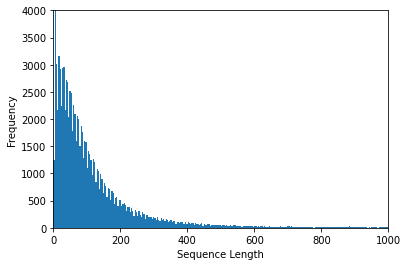

In [9]:
import matplotlib.pyplot as plt
plt.hist(lens,1000)
plt.xlabel('Sequence Length')
plt.ylabel('Frequency')
plt.axis([0, 1000, 0, 4000])
plt.show()

In [6]:
import numpy as np
sentences = []
a = np.zeros(200, dtype=np.float32)
for s in data["body"]:
    for word in s.split(' '):
        try:  
            wordv = wordVec[word]
        except:
            wordv = np.zeros(200, dtype=np.float32)
        a = a + wordv
        a = a * [0.5]
    sentences.append(a)
    a = np.zeros(200, dtype=np.float32)
# print(sentences)

In [39]:
np.save("sentences",sentences)

In [101]:
sentences[0]

array([ 0.18181895, -0.18478764,  0.01444958,  0.22907507, -0.09021935,
        0.16219072,  0.13144097,  0.12072639, -0.25524603,  0.11730236,
       -0.10750974,  0.07608761,  0.04771378, -0.41542199, -0.19797055,
       -0.29868219, -0.15142325,  0.04769415,  0.0032044 ,  0.36735317,
       -0.0390186 , -0.00942966, -0.00517862, -0.29210379, -0.41873971,
       -0.14669192,  0.14342372, -0.01963969, -0.19858859,  0.05060465,
       -0.28489202, -0.06144533,  0.10825618,  0.22729487,  0.0028166 ,
        0.22335138, -0.08707802, -0.47908292, -0.03636216,  0.086673  ,
       -0.06484153,  0.1501187 ,  0.59892918,  0.15973636,  0.19743233,
        0.07557545,  0.22138335,  0.20783696,  0.34200795, -0.01712352,
       -0.0223445 , -0.00402339, -0.27834225,  0.11794879,  0.05587608,
       -0.18944569, -0.06087735,  0.25566309,  0.01823381,  0.06225607,
        0.09092346, -0.31813888,  0.09290072,  0.07849164, -0.11221086,
       -0.57156948,  0.24761438, -0.40513179,  0.1416564 ,  0.01

In [36]:
pca = PCA(n_components=2)
result = pca.fit_transform(sentences[1:1000])

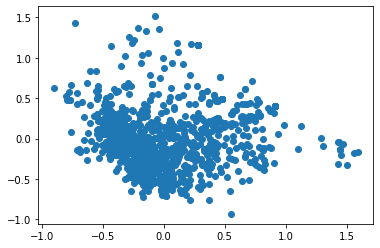

In [37]:
plt.scatter(result[:, 0], result[:, 1])

In [45]:
wordVec.most_similar(['opensource'])

[('orglicensesmit-license', 0.9683921337127686),
 ('cakefoundation', 0.9360439777374268),
 ('@license', 0.9112040400505066),
 ('pymvpa', 0.9088312387466431),
 ('comradixforensics', 0.9072269797325134),
 ('radixforensics', 0.9021878242492676),
 ('robots', 0.8976638913154602),
 ('comroestenburg', 0.895201563835144),
 ('org3', 0.8909894227981567),
 ('grouplens', 0.8908069133758545)]

In [47]:
kmeans = KMeans(n_clusters=100, random_state=1).fit(sentences)

In [59]:
y_pred = kmeans.labels_
cluster_center = pd.DataFrame(kmeans.cluster_centers_)
x_out = pd.DataFrame(sentences,index=kmeans.labels_)
x_outwithcenter=x_out.append(cluster_center)

In [49]:
from collections import Counter

center_dict = Counter(y_pred)
center_dict

Counter({3: 983,
         90: 2297,
         2: 3026,
         93: 4361,
         74: 1716,
         47: 1854,
         29: 2253,
         99: 1501,
         91: 3807,
         62: 1601,
         26: 787,
         46: 762,
         98: 1910,
         36: 2696,
         45: 712,
         19: 722,
         32: 5069,
         41: 4579,
         59: 1073,
         18: 577,
         28: 1193,
         23: 584,
         85: 149,
         83: 2352,
         9: 1202,
         92: 7798,
         78: 210,
         1: 2707,
         50: 324,
         15: 397,
         80: 230,
         42: 538,
         37: 663,
         22: 289,
         40: 823,
         4: 549,
         69: 321,
         44: 2298,
         27: 568,
         88: 1190,
         57: 333,
         70: 1774,
         13: 1059,
         20: 795,
         39: 499,
         66: 317,
         63: 720,
         77: 2103,
         31: 442,
         81: 426,
         16: 795,
         68: 701,
         43: 525,
         25: 899,
         

In [60]:
#用TSNE进行数据降维并展示聚类结果
tsne = TSNE()
tsne.fit_transform(x_outwithcenter) #进行数据降维,并返回结果
x_tsne = pd.DataFrame(tsne.embedding_, index = x_outwithcenter.index)
#将index化成原本的数据的index，tsne后index会变化

In [83]:
# 第90个聚类的center
d = x_tsne[x_tsne.index == 90].tail(1)
d

,0,1
90,16.053606,-11.760778


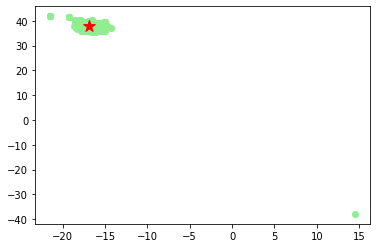

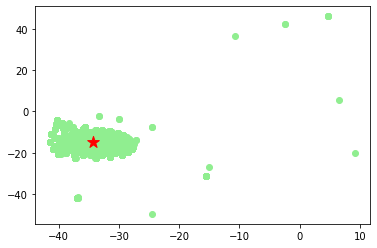

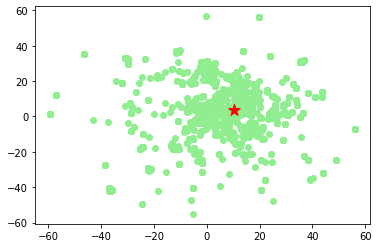

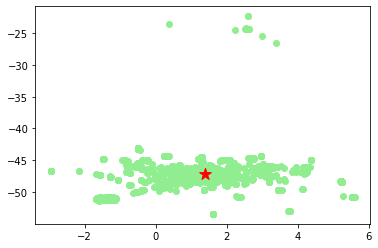

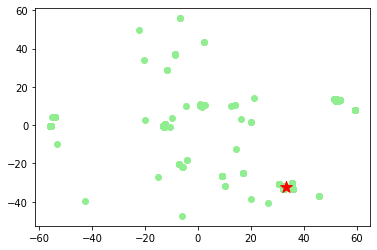

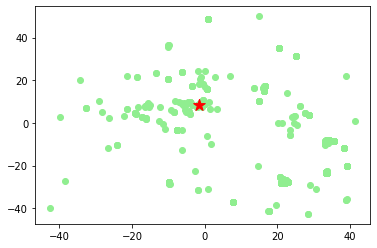

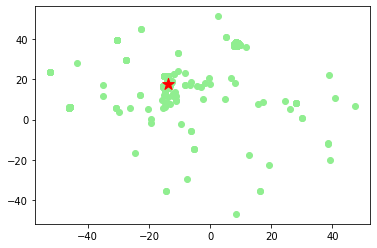

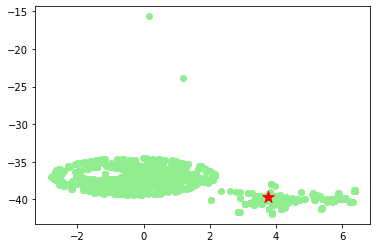

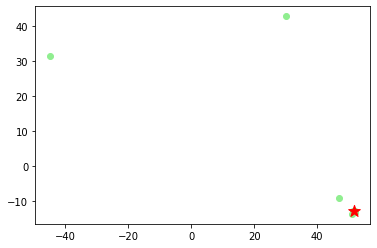

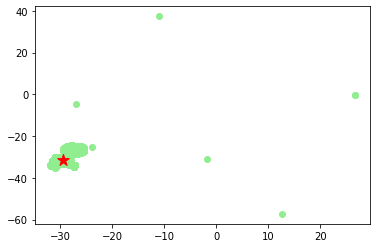

In [82]:
for i in range(10): 
    d = x_tsne[x_tsne.index == i]     #找出聚类类别为0的数据对应的降维结果
    plt.scatter(d[0], d[1],c='lightgreen', marker='o')
    d = x_tsne[x_tsne.index == i].tail(1)
    plt.scatter(d[0], d[1], c='red',s=150, marker='*')
    plt.show()
#     d = x_tsne[x_tsne.index == i]
#     plt.scatter(d[0], d[1], c='orange', marker='o')
#     d = x_tsne[x_tsne.index == i].tail(1)
#     plt.scatter(d[0], d[1], c='red',s=150, marker='*')
#     plt.show()
#     d = x_tsne[x_tsne.index == i]
#     plt.scatter(d[0], d[1], c='lightblue', marker='o')
#     d = x_tsne[x_tsne.index == i].tail(1)
#     plt.scatter(d[0], d[1], c='red',s=150, marker='*')
#     plt.show()
#取中心点，画出
# d = x_tsne.tail(3)
# plt.scatter(d[0], d[1], c='red',s=150, marker='*')
# plt.show()

In [128]:
res0Series = pd.Series(kmeans.labels_)
res0 = res0Series[res0Series.values == 1]
res0.index

Int64Index([   41,    55,    74,   108,   206,   261,   268,   273,   292,
              293,
            ...
            99539, 99560, 99639, 99649, 99693, 99720, 99757, 99847, 99969,
            99970],
           dtype='int64', length=2707)

In [139]:
# words_in_group_1 = []
# for item in res0Series[res0Series.values == 1].index:
#     words_in_group_1.append(data['body'][item])
# words_in_group_1

['why using static methods here',
 'you should fix the indentation here',
 'ah  right  it is not a routing placeholder   but retrieving the token from the session is a problem  you dont do a search anymore here',
 'why are you using a dash everywhere   this is not correct here',
 'there is an indentation issue here',
 'the indentation is broken here',
 'the indentation is wrong here',
 'same here',
 'i dont understand what your comment mean as it is **not** a comparison here',
 'do we really need this here',
 'could an iframe help here',
 'the indentation is wrong here',
 'are the parenthesis needed here',
 'as discussed on irc    being able to normalize scalararrays is a nice feature but very edge case  so if at all it should be supported optionally  but adding this feature at the expensive of dropping the cache is a no go  that just doesnt scale well if you have a few normalizers   also removing the supports   simplifies things  but i dont really like how exceptions are being used fo

In [131]:
# words1 = []
# for item in res0Series[res0Series.values == 1].index:
#     temps = []
#     for word in data['body'][item].split(' '):
#         if(word is not ''):
#             temps.append(word)
#     words1.append(temps)
# words1

[['why', 'using', 'static', 'methods', 'here'],
 ['you', 'should', 'fix', 'the', 'indentation', 'here'],
 ['ah',
  'right',
  'it',
  'is',
  'not',
  'a',
  'routing',
  'placeholder',
  'but',
  'retrieving',
  'the',
  'token',
  'from',
  'the',
  'session',
  'is',
  'a',
  'problem',
  'you',
  'dont',
  'do',
  'a',
  'search',
  'anymore',
  'here'],
 ['why',
  'are',
  'you',
  'using',
  'a',
  'dash',
  'everywhere',
  'this',
  'is',
  'not',
  'correct',
  'here'],
 ['there', 'is', 'an', 'indentation', 'issue', 'here'],
 ['the', 'indentation', 'is', 'broken', 'here'],
 ['the', 'indentation', 'is', 'wrong', 'here'],
 ['same', 'here'],
 ['i',
  'dont',
  'understand',
  'what',
  'your',
  'comment',
  'mean',
  'as',
  'it',
  'is',
  '**not**',
  'a',
  'comparison',
  'here'],
 ['do', 'we', 'really', 'need', 'this', 'here'],
 ['could', 'an', 'iframe', 'help', 'here'],
 ['the', 'indentation', 'is', 'wrong', 'here'],
 ['are', 'the', 'parenthesis', 'needed', 'here'],
 ['as',

In [142]:
# dictionary = corpora.Dictionary(words1)  #生成字典,且对词语编号Id
# for key,value in dictionary.items():
#     print(key,value)

0 here
1 methods
2 static
3 using
4 why
5 fix
6 indentation
7 should
8 the
9 you
10 a
11 ah
12 anymore
13 but
14 do
15 dont
16 from
17 is
18 it
19 not
20 placeholder
21 problem
22 retrieving
23 right
24 routing
25 search
26 session
27 token
28 are
29 correct
30 dash
31 everywhere
32 this
33 an
34 issue
35 there
36 broken
37 wrong
38 same
39 **not**
40 as
41 comment
42 comparison
43 i
44 mean
45 understand
46 what
47 your
48 need
49 really
50 we
51 could
52 help
53 iframe
54 needed
55 parenthesis
56 able
57 adding
58 all
59 also
60 at
61 be
62 being
63 cache
64 case
65 control
66 discussed
67 doesnt
68 dropping
69 edge
70 exceptions
71 expensive
72 feature
73 few
74 flow
75 for
76 go
77 have
78 how
79 if
80 irc
81 just
82 like
83 nice
84 no
85 normalize
86 normalizers
87 of
88 on
89 optionally
90 removing
91 scalararrays
92 scale
93 simplifies
94 so
95 supported
96 supports
97 that
98 things
99 to
100 used
101 very
102 well
103 extra
104 line
105 better
106 imo
107 invalidargumentexcept

1421 models
1422 modelsfieldsrelated
1423 nicely
1424 overridden
1425 parent
1426 place
1427 preferably
1428 relatedfield
1429 release
1430 such
1431 therein
1432 frameworks
1433 little
1434 migration
1435 own
1436 prompt
1437 raising
1438 sounds
1439 their
1440 topic
1441 parens
1442 guest
1443 love
1444 localized
1445 srcnlsrootstrings
1446 assume
1447 behaved
1448 calling
1449 ensure
1450 initialization
1451 resolution
1452 running
1453 tries
1454 v
1455 certain
1456 nativewindow
1457 terminated
1458 whos
1459 10
1460 <0
1461 @jakevdp
1462 @magsol
1463 arpack
1464 modification
1465 scipy
1466 taken
1467 +=
1468 linalgerror
1469 relevant
1470 wonder
1471 cyclicreference#{sym
1472 info}
1473 log
1474 #include
1475 h
1476 utilsstdstring
1477 am
1478 classes
1479 editors
1480 identify
1481 names
1482 opposite
1483 stating
1484 suffixes
1485 suggesting
1486 surprised
1487 voted
1488 constants
1489 duplicating
1490 print_status
1491 minor
1492 behavior
1493 runnable
1494 schedulenext
1495

2951 asyncreplay
2952 implementor
2953 replaycallback
2954 date_formatter
2955 msg
2956 **kwargs
2957 almost
2958 initiliaze
2959 symfony
2960 asarray
2961 am_conditional
2962 %w
2963 -%d%s
2964 @property
2965 _weekday_dict
2966 rule_code
2967 suffix
2968 week
2969 weekday
2970 weekofmonth
2971 wom
2972 yea
2973 backward
2974 goal
2975 applied
2976 [object
2977 object]
2978 initialautorunscript
2979 documentations
2980 docsmodulesmetrics
2981 linux
2982 os
2983 syscall
2984 unshare
2985 variant
2986 incorrect
2987 box
2988 comendevtopicsauthdefault#authentication-in-web-requests
2989 djangoproject
2990 dynamically
2991 permissions
2992 reloading
2993 reloads
2994 snippet
2995 subsection
2996 mknod
2997 odd
2998 requires
2999 root
3000 sudo
3001 leaking
3002 merge-conflict
3003 remains
3004 safer
3005 evolved
3006 #484848
3007 nit
3008 exe
3009 get_custom_exe
3010 redefining
3011 bundlesversiondynbinarydocker-version
3012 dockerinit
3013 drop
3014 fyi
3015 picks
3016 symlink
3017 tiny
3

4431 check_index_type
4432 check_less_precise
4433 check_series_type
4434 nan
4435 pyc
4436 treats
4437 unambiguous
4438 usersiswhugheslocal_srcpandaspandasutiltesting
4439 {0}
4440 {1}
4441 area
4442 bar
4443 comjoomlajoomla-cmscommitd137a3496a3fd3b9f1c1ee18049cac0995d840f7
4444 pedantic
4445 nitpicky
4446 dipatcher
4447 envs
4448 @kuon
4449 firewalld
4450 persist
4451 isnotexist
4452 15
4453 can;
4454 bridge
4455 exercised
4456 hasbridgeannotation
4457 refchecks
4458 jsx
4459 parseexception
4460 jcontrollerlegacy
4461 views
4462 [an
4463 comchanksquepull53
4464 hopefully
4465 isolate
4466 issue]
4467 que
4468 replicate
4469 sorted
4470 inserting
4471 treatment
4472 aliases
4473 expressions
4474 first|last
4475 s*
4476 words
4477 created_atupdated_at;
4478 highlighted
4479 indexed
4480 yard
4481 adddefaultsifnotset
4482 #between-containers
4483 [communication
4484 [this]
4485 containers
4486 containers]
4487 etchosts
4488 linked
4489 recipient
4490 reword
4491 http2exception
4492 inte

In [147]:
# dictionary[4665]

'licenses'

In [143]:
# new_corpus = [dictionary.doc2bow(text) for text in words1]
# new_corpus

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1)],
 [(0, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)],
 [(0, 1),
  (8, 2),
  (9, 1),
  (10, 3),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 2),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1)],
 [(0, 1),
  (3, 1),
  (4, 1),
  (9, 1),
  (10, 1),
  (17, 1),
  (19, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1)],
 [(0, 1), (6, 1), (17, 1), (33, 1), (34, 1), (35, 1)],
 [(0, 1), (6, 1), (8, 1), (17, 1), (36, 1)],
 [(0, 1), (6, 1), (8, 1), (17, 1), (37, 1)],
 [(0, 1), (38, 1)],
 [(0, 1),
  (10, 1),
  (15, 1),
  (17, 1),
  (18, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1)],
 [(0, 1), (14, 1), (32, 1), (48, 1), (49, 1), (50, 1)],
 [(0, 1), (33, 1), (51, 1), (52, 1), (53, 1)],
 [(0, 1), (6, 1), (8, 1), (17, 1), (37, 1)],
 [(0, 1), (8, 1), (28, 1), (54, 1), (55, 1)],
 [(0, 1),
  (7, 1),
  (8, 3),
  (9,

In [140]:
# tfidf = models.TfidfModel(new_corpus) #训练的模型
# #载入模型得到单词的tfidf值
# tfidf_vec = []
# for i in range(len(words_in_group_1)):
#     string = words_in_group_1[i]
#     string_bow = dictionary.doc2bow(string.lower().split())
#     string_tfidf = tfidf[string_bow]
#     tfidf_vec.append(string_tfidf)
# tfidf_vec

[[(1, 0.5372492350489323), (2, 0.6419462015608185), (3, 0.4608310027105333), (4, 0.2947933525060878)], [(5, 0.6492455453227239), (6, 0.6297797955737438), (7, 0.3237653111648164), (8, 0.15913157229254007), (9, 0.2274000812483276)], [(8, 0.10110522897609968), (9, 0.07224002425341977), (10, 0.22309757995407714), (11, 0.2735761292766694), (12, 0.2666760847316576), (13, 0.1252275713052018), (14, 0.13226346326074628), (15, 0.12310827905478644), (16, 0.15707534714237337), (17, 0.13931690972764954), (18, 0.0896889454454907), (19, 0.09093240561053591), (20, 0.3227518691307008), (21, 0.21152325442107317), (22, 0.35377830655849896), (23, 0.19214752767678), (24, 0.30460256670446756), (25, 0.30460256670446756), (26, 0.28173714981062964), (27, 0.3227518691307008)], [(3, 0.2988474691580347), (4, 0.19117257042793798), (9, 0.12202964174878479), (10, 0.12562065622289306), (17, 0.11766879066910103), (19, 0.1536052762258533), (28, 0.22396089443153447), (29, 0.36740698027101537), (30, 0.5976110951510609), 

In [150]:
# tfidf_vec[0]

[(1, 0.5372492350489323),
 (2, 0.6419462015608185),
 (3, 0.4608310027105333),
 (4, 0.2947933525060878)]

In [155]:
# 原始语料
longcontents = []
for i in range(100):
    longcontent = ""
    for item in res0Series[res0Series.values == i].index:
        longcontent = longcontent + " " + data['body'][item]
    longcontents.append(longcontent)
len(longcontents)

100

In [156]:
# 分词
seg_list = []
for i in range(len(longcontents)):
    tempseg = []
    for word in longcontents[i].split(' '):
        if word is not ' ':
            tempseg.append(word)
    seg_list.append(tempseg)
len(seg_list)

100

In [157]:
dictionary = corpora.Dictionary(seg_list)  #生成字典,且对词语编号Id
for key,value in dictionary.items():
    print(key,value)

0 
1 #
2 #2388
3 #u
4 #{counter
5 #{rport
6 $
7 $buf
8 $choices
9 $input-getoption
10 $object
11 $options
12 $r
13 $realcachedir
14 $relativepathtemplate
15 $requestorder
16 $str
17 $suite
18 $tanglulatest
19 $this-getname
20 $this-isdisabled
21 $trustedheaders
22 $val
23 $value
24 $warmupdir
25 %c
26 %s
27 %s%s
28 %}
29 %}bodyclass_constitency_check{%
30 &
31 &&
32 &m
33 *
34 *-updates
35 *this
36 +
37 ++
38 +43
39 +=
40 +around
41 +sparseness
42 +the
43 +there
44 +while
45 -
46 --
47 -1
48 -43
49 -a
50 -s
51 -style
52 0
53 04292013
54 06
55 0;
56 0f
57 0xff
58 1
59 10
60 100
61 100%
62 11
63 12
64 13
65 15
66 193
67 1;
68 2
69 2007
70 2011
71 2012
72 2013
73 2014
74 255
75 255s
76 2m
77 3
78 30}}
79 3742134
80 38400
81 3c-4c
82 3rd
83 43
84 46
85 4channel
86 5
87 500ms
88 5050
89 57600
90 59
91 5sec
92 6
93 67
94 7
95 8
96 987
97 ;
98 <
99 <%=
100 <=
101 =
102 ==
103 @@
104 @alexandresalome
105 @arjoly
106 @benjamn
107 @carlosantoniodasilva
108 @creack
109 @drewhk
110 @egilburg
111 @

1366 on
1367 once
1368 one
1369 oneforonestrategy
1370 ones
1371 only
1372 onmessage
1373 ooh
1374 oops
1375 open
1376 operate
1377 operation
1378 operations
1379 opinion
1380 opposed
1381 optimization
1382 optimizations
1383 optimize
1384 optimizes
1385 optimum
1386 option
1387 optional
1388 options
1389 or
1390 order
1391 ordered
1392 orgdoctestsiterable
1393 original
1394 orm
1395 orthogonal
1396 other
1397 otherwise
1398 our
1399 out
1400 outer
1401 output
1402 outside
1403 outstanding
1404 override
1405 own
1406 owns
1407 package
1408 packageless
1409 packet
1410 page
1411 paper
1412 paplayer
1413 parameter
1414 parameters
1415 parametrize
1416 params
1417 parent
1418 parents
1419 parse
1420 parseint
1421 parsers
1422 parsing
1423 part
1424 particular
1425 party
1426 pass
1427 passed
1428 passing
1429 password
1430 patch
1431 path
1432 paths
1433 pattern
1434 patterns
1435 payload
1436 pcas
1437 pdeathsig
1438 penalties
1439 penalty
1440 people
1441 peoples
1442 pep
1443 pep8
1444

3075 consolidate
3076 constraint
3077 construct
3078 constructed
3079 constructive
3080 consumer
3081 consuming
3082 consumption
3083 contained
3084 container
3085 containers
3086 containers]
3087 containing
3088 containserror
3089 contaminate
3090 content-type
3091 contentdocument
3092 contention
3093 contents
3094 contenttype
3095 contenttypes
3096 context
3097 continuing
3098 contract
3099 contradicts
3100 contrast
3101 contrib
3102 contribute_to_class
3103 contribute_to_related_class
3104 contributors
3105 control
3106 control_btn_levels
3107 controlled
3108 controllers
3109 convergence
3110 converting
3111 converting-model-field-to-serialization
3112 converts
3113 convetion
3114 convey
3115 conveys
3116 convince
3117 cook
3118 cookie
3119 cool
3120 copied
3121 copier
3122 copies
3123 copypaste
3124 corealgorithms
3125 corecommon
3126 coreops
3127 cores
3128 coreseries
3129 correcting
3130 correlate
3131 correspondence
3132 correspondig
3133 corresponds
3134 cosmetic
3135 cosmetics

4437 or_
4438 oracle
4439 orange
4440 ordering
4441 org
4442 organ
4443 orgclassesactivesupporthashwithindifferentaccess
4444 orgen-usdocswebhtmlelementvideo#attr-loop
4445 orglicenseslicense-list
4446 orgpipermailffmpeg-devel2013-december152126
4447 orgpkgbufio#reader
4448 orgpkgioioutil#readfile
4449 orgpkgstrings#hasprefix
4450 orgpublinuxutilsnetiproute2
4451 original_content_type_id
4452 originally
4453 orignal
4454 orthotopic
4455 os
4456 osgi
4457 osvdb
4458 others
4459 otoh
4460 ouch
4461 ought
4462 outcome
4463 output_compression=1
4464 outputsend
4465 ova
4466 over
4467 overfitting
4468 overhead
4469 overkill
4470 overloads
4471 overlooked
4472 overridable
4473 overridden
4474 override_settings
4475 overrides
4476 overriding
4477 oversight
4478 overview
4479 overwrite
4480 overwriting
4481 ownerdocument
4482 oxford
4483 p
4484 p_name
4485 padpow2
4486 page]
4487 pages
4488 pandas
4489 pandas**init**
4490 pandaserror
4491 pandassqlengine
4492 panel
4493 panels
4494 panic
4495 

6115 [false
6116 [float64]
6117 [from_key
6118 [give
6119 [how
6120 [i]
6121 [is
6122 [lookup[tuple
6123 [moving
6124 [nan
6125 [rex
6126 [root
6127 [sender
6128 [si-7172]
6129 [src]
6130 [title
6131 [to_key
6132 [topleveltype];
6133 [true
6134 [unreachable]
6135 [user]
6136 ]]+
6137 ^^
6138 _1
6139 __call
6140 __cinit__
6141 __clean_tmp
6142 __construct
6143 __dealloc__
6144 __file__
6145 __getstate__
6146 __html
6147 __in
6148 __init__
6149 __isset
6150 __len__
6151 __next__
6152 __opts__[file_roots]]
6153 __path__
6154 __set__
6155 __setstate__
6156 __warningregistry__
6157 _a_layers
6158 _after_
6159 _all_
6160 _and_
6161 _arrest_
6162 _build_tree
6163 _c_
6164 _checkproptypes
6165 _co_
6166 _com_
6167 _competing_
6168 _connection_
6169 _connection_defaults
6170 _constructor
6171 _continue
6172 _convert_to_array
6173 _copy_
6174 _db
6175 _defaultconfig
6176 _delaying_
6177 _do_
6178 _does_
6179 _easily_
6180 _execute_insert
6181 _existing_
6182 _get_loc_level
6183 _getvalue
6184 _h

7444 encourage
7445 end-users
7446 endianness
7447 ending
7448 endings
7449 endl
7450 endless
7451 endlessly
7452 endpoints
7453 endpointwriter
7454 endptr]
7455 enforce
7456 enforcement
7457 enforces
7458 enforcing
7459 engineering
7460 enormous
7461 enough;
7462 ensure_clean_path
7463 ensured
7464 ensurelistening
7465 enter
7466 entitytweet
7467 entriesinuse
7468 entryimpl
7469 entrymap
7470 enum
7471 enumeratedevices
7472 enumeration
7473 env[action_dispatch
7474 env[path_info]
7475 envorelse
7476 epic
7477 episodes
7478 equal-star
7479 equality
7480 equals
7481 equatableinterface
7482 equivalently
7483 erase
7484 erb
7485 errconflictattachdetach
7486 errconflictdetachautoremove
7487 erroneous
7488 erroneous;
7489 errored
7490 errornon-exception
7491 errorpublisher
7492 errors[
7493 errorsuccessful
7494 errs
7495 ers
7496 es6
7497 es6-class
7498 escalate
7499 essence
7500 establish
7501 establishing
7502 etcsalt
7503 eternity
7504 etherwise
7505 ethos
7506 euphoric
7507 eval
7508 ev

9115 poking
9116 policies
9117 policy
9118 policychanged
9119 polish
9120 polled
9121 poller
9122 polling
9123 polluted
9124 polluting
9125 pollution
9126 pondering
9127 poolarea
9128 pooled
9129 pops
9130 popular
9131 populate
9132 populate_models
9133 populated
9134 popup
9135 popup_icon
9136 pos--
9137 pos_=
9138 posibrains
9139 positions
9140 positives
9141 posix
9142 possessive
9143 possibilities
9144 post-1
9145 post-process
9146 post_save
9147 postmixin
9148 postrender
9149 postrestart
9150 power
9151 powerful
9152 pr-validator
9153 practical
9154 pragma
9155 pre
9156 pre-create
9157 pre-training
9158 precarious
9159 precautionary
9160 preceding
9161 precendence
9162 precisely
9163 predefined
9164 predicate
9165 predict
9166 predicting
9167 prediction
9168 predictions
9169 prefered
9170 prefers
9171 prefer”
9172 preg_match
9173 preliminary
9174 prematurely
9175 prempted
9176 prepare
9177 prepend
9178 prependfork
9179 preprod
9180 prerequisites
9181 prerestartdefault
9182 present

10615 whenstopping
10616 whenver
10617 whichever
10618 whichmodule
10619 whil
10620 whilst
10621 whiped
10622 white-spaces
10623 whoa
10624 whose
10625 wide
10626 widening
10627 widget
10628 widgets
10629 width
10630 widthheight
10631 wild
10632 wildcard
10633 win32
10634 win_h
10635 win_w
10636 window=-1
10637 windowed
10638 windowing
10639 windowscygwin
10640 wineventsx11
10641 wins
10642 winsystemx11
10643 wire
10644 withbatch
10645 withfallback
10646 withterminationmanagement
10647 woah
10648 wondering
10649 won’t
10650 words_bigendian
10651 workarounds
10652 worker
10653 workinprogresscibamorphamorph
10654 worthwhile
10655 wouldbe
10656 wouldve
10657 wow64
10658 wrappedterminated
10659 wrappers
10660 writability
10661 writeinterest
10662 writemessages
10663 writeobject
10664 writeoutbound
10665 writerindex
10666 wrong;
10667 wrongly
10668 wrt
10669 wvu-r7
10670 x86
10671 x_indices[startptr
10672 x_test
10673 xbmc_key
10674 xbmcmain
10675 xbmcrendermanager
10676 xbmcvideoplayercont

12222 pdevicereport-m_drac3ok
12223 perceived
12224 performchannelswitch
12225 periods=3
12226 phils
12227 php#l181
12228 php#l254
12229 pic
12230 pk=%s
12231 pk=reused_f
12232 playerid
12233 pre-compute
12234 pre-defined
12235 predef
12236 predictedlabel
12237 preg
12238 preg_quote
12239 preparesql
12240 prevoous
12241 prog
12242 prone
12243 propertypath
12244 proxyobject
12245 pseudo-lh
12246 ptr<
12247 publication
12248 py3
12249 qn
12250 qs1
12251 qs2
12252 qualifier
12253 querybuilder
12254 queryinfo
12255 queues
12256 quoted
12257 qval
12258 range1
12259 range1[0]
12260 range2
12261 range2[0]
12262 re2
12263 read_attribute
12264 readindex
12265 redblacktree
12266 referrable
12267 reflectivedynamicaccess
12268 reformulating
12269 registerconsumer
12270 registerloader
12271 regularunicoderaw
12272 reject{|i|
12273 remembers
12274 remnant
12275 rendererd
12276 replies
12277 reporter
12278 representable
12279 representations
12280 represents
12281 request_parameters
12282 request_raw

13741 xe9xa3xf7xffxff
13742 xerr
13743 xf
13744 xf[i]
13745 xf[j]
13746 xf[p
13747 xml_req
13748 xml_rpc
13749 xp[i
13750 xxx
13751 y[0]
13752 y[rsample_inlier_idx]
13753 y_pred
13754 y_pred]
13755 yerr
13756 yours
13757 zdi
13758 {0};
13759 {action
13760 {changes
13761 {line
13762 {metric
13763 {multipart
13764 {p
13765 {rport
13766 {something
13767 {uri
13768 {util
13769 |owner|
13770 ||=
13771 “with
13772 #7256
13773 $0
13774 $commit
13775 $dcoprefix
13776 $elements
13777 $error
13778 $new_file
13779 $options[update];
13780 $pattern;
13781 $route-hostnamepattern
13782 $script_dir*
13783 $this-hostnamepattern
13784 ${badcommits[@]};
13785 -p
13786 -pe
13787 2devnull
13788 95
13789 @metalivedev
13790 @pborreli
13791 @yguedidi
13792 [github
13793 [prevent
13794 [test]
13795 [x5cx2f]+
13796 advices
13797 aforementioned
13798 afterward
13799 apparent
13800 assembly
13801 assignable
13802 auto_register
13803 awaitable
13804 awesomely
13805 basis
13806 bbox
13807 bingrouper
13808 boot2dock

15114 +7
15115 +72
15116 +721
15117 +750
15118 +770
15119 +83
15120 +846
15121 +868
15122 +887
15123 +89
15124 +9
15125 +90
15126 +902
15127 +93
15128 +957
15129 +97
15130 +===========================
15131 +@implicitnotfound
15132 +^^^^^^^^^^^^^^^
15133 +_*
15134 +_fwf_widths
15135 +a
15136 +akka
15137 +an
15138 +bool
15139 +case
15140 +cdef
15141 +class
15142 +com_finder_config_stemmer_description=the
15143 +const
15144 +cpackage
15145 +creating
15146 +deactivation
15147 +final
15148 +from
15149 +func
15150 +function
15151 +gopath
15152 +h
15153 +handler
15154 +httpd
15155 +import
15156 +in
15157 +m_avo_width-offset
15158 +main
15159 +mod_status_messages=%d
15160 +mod_status_messages_0=%d
15161 +mod_status_messages_1=%d
15162 +mod_status_users=%s
15163 +mod_status_users_0=%s
15164 +mod_status_users_1=%s
15165 +module
15166 +more
15167 +namespace
15168 +object
15169 +on
15170 +option
15171 +package
15172 +pca
15173 +plg_user_joomla_field_forcelogout_desc=set
15174 +plg_user_joomla_fie

16614 comrailsrailsblobmasterguidesbug_report_templatesactive_record_master
16615 comrailsrailsblobmasterrailtieslibrailsapplication
16616 comrailsrailsblobmasterrailtiestestisolationabstract_unit
16617 comrailsrailscommit047db112991785d871e9a6ba165b93752b0fff06
16618 comrailsrailscommit069bc273853c90194606b1725113d77ae39e2edd
16619 comrailsrailscommit3007c297d35c4742b9267b31adb5ff7a19e9cda6
16620 comrailsrailscommit5757fe476a126d4f7de2791da5af0e6aeef0d1e6
16621 comrailsrailscommit67ec435cfbb1f8d929b62dd4e76e11f7e50aa9db#diff-fc9e818ac969c86e7483a16b3fd04ae2l22
16622 comrailsrailscommit72e11abeaf6500fa81ee2260fa446fcabcc2a944
16623 comrailsrailscommit8683396dd8c31c70ba9332586ee05889305fdde6
16624 comrailsrailscommita3c8e4add7178e86d80584f2c7df51b77fc882ff
16625 comrailsrailscommita662a789
16626 comrailsrailscommitc2c1ecb05e98dacab04f02c08cc3876de436e4dd
16627 comrailsrailsissues10197#issuecomment-18447337
16628 comrailsrailsissues13851
16629 comrailsrailsissues14169#issuecomment-478281

18113 msfpayload
18114 msg=[simulated
18115 multi-cache
18116 multi-dimensional
18117 multi-jvm
18118 multifailurecb
18119 multilingual
18120 multipartmarshallers
18121 multiplicationresult
18122 multiply
18123 mutability
18124 mutationtest
18125 mx6
18126 mx7
18127 mysqldb
18128 mysqlsqlitesqlserver
18129 myweirdoptionrate=1000
18130 n_class
18131 n_components=none
18132 n_points]
18133 n_symbols
18134 na_values=none
18135 naive
18136 naiveredeliverer
18137 name%
18138 nameresolver
18139 names=none
18140 nanskew
18141 nap
18142 napisał
18143 nat_rep
18144 nathan
18145 ndarrays
18146 neatness
18147 neccessary
18148 neg
18149 neg_label=none
18150 neg_label_indices
18151 neighborly
18152 nelson
18153 netbeans
18154 netfilter_xt_match_{addrtype
18155 nettyremotesupport
18156 new_branch_name_of_your_choosing
18157 new_data
18158 new_labels
18159 new_record]
18160 new_type
18161 newbehaviors
18162 newbie-friendly
18163 newbuilder
18164 newcapacity
18165 newdir
18166 newfailedfuture
18167 ne

19478 4-6
19479 48khz
19480 521
19481 799
19482 95e9aa26f6f91ce3b59d57560f6e5a93bb459291
19483 <=4
19484 @configdir
19485 @cpuguy83
19486 @goetas
19487 @larsmans
19488 @lsm5
19489 @norman
19490 @petehunts
19491 @philips
19492 @skie
19493 @skipif
19494 []bytes
19495 [calling]
19496 [constructor]
19497 [cs-fixer
19498 [foundation
19499 [internally]
19500 [si-8180]
19501 __cplusplus_winrt
19502 _addcookies
19503 _allowed_
19504 _get_queryset_methods
19505 _getrelativemenuitem
19506 _reacttoplistenersid;
19507 _restoresystemtimezone
19508 _select
19509 _wrap
19510 absc
19511 ac3
19512 accesor
19513 accuracy
19514 achieving
19515 actorprocessor
19516 add-ons
19517 adheres
19518 adriaan
19519 ae_fmt_ac3
19520 ae_fmt_dts
19521 algocode
19522 aligns
19523 all-free
19524 alpha;
19525 alterations
19526 arg1
19527 arg2
19528 armv7l
19529 arrat
19530 articletag
19531 as_instance
19532 askvalidate
19533 assert_all_finite
19534 assert_index_equal
19535 assert_nil
19536 attribution
19537 backported
1

21113 reckon
21114 recursivity
21115 reflective
21116 reformulate
21117 regressed
21118 regret
21119 reimplementing
21120 relative_url_root
21121 removemenuitem
21122 remover
21123 render-agnostic
21124 rendercomponenttostringbla
21125 reordered
21126 repertoire
21127 replaceable
21128 replacestate
21129 replaygain
21130 report]
21131 repositories
21132 req_access
21133 requestmatcher
21134 require-factory
21135 rescope
21136 respond_to_missing
21137 responsewriter
21138 responsibilty
21139 resursion
21140 retroactive
21141 retrospect
21142 reworded
21143 rich
21144 righteho
21145 ripe
21146 robot
21147 roemer
21148 routehandler
21149 runtimeruntime_btfs
21150 runtimeruntime_btrfs
21151 safe_str
21152 safestringio
21153 sand
21154 save_existing
21155 save_new
21156 scala-to-java
21157 scalac-hash
21158 scaled
21159 scrap
21160 sdk
21161 season
21162 self-documentating
21163 self-training
21164 selinux_test
21165 send_mail
21166 sendaction
21167 senes
21168 sep=n
21169 serializeto
21170

22550 _opts__
22551 _peter
22552 _pm
22553 _prepareupdatefields
22554 _print_as_set
22555 _reject
22556 _reporter
22557 _s*
22558 _score_func
22559 _scorer
22560 _sd_booted
22561 _semantic
22562 _server
22563 _setcontenttype
22564 _setsubtitlevisible
22565 _settings
22566 _sign
22567 _sparse_
22568 _step
22569 _take_2d_object
22570 _target_
22571 _validate_flavor
22572 _weekday
22573 _weekday_dict[self
22574 _will_
22575 _x_
22576 a-b
22577 a-la
22578 aaaaaaaaaa
22579 aaron
22580 abcdefghijklmnopqrstuvwxyz
22581 abcdefghijklmnopqrstuvwxyzi
22582 abcmeta
22583 abdms
22584 abid
22585 aborted
22586 abou
22587 abraham
22588 absdiff
22589 absent
22590 abstractchannelhandlercontext
22591 abstractextensionid
22592 abstracting
22593 abstractprocesstest
22594 accords
22595 aclass
22596 acquire
22597 acquires
22598 acronyms
22599 action_methods
22600 actionmailer
22601 actionmailerlibaction_mailerbase
22602 actionpack-4
22603 actionpackchangelog
22604 actionpacklibaction_dispatchhttprequest
2260

24112 extendsearlier
24113 extendslater
24114 extensionidprovider
24115 extensions;
24116 externalsignature
24117 extra={
24118 extra_context=none
24119 extract_precision
24120 extract_scale
24121 extrahosts
24122 f7336d0https
24123 f=assert
24124 f_1
24125 f_n
24126 f_n}
24127 f_p}
24128 fabisch
24129 facsimiletelephonenumber
24130 failandrecycle
24131 failuredetec
24132 failuredetector
24133 fakecontext
24134 faked
24135 fallen
24136 false;+
24137 false;-
24138 falsern
24139 family_name
24140 fast_memcpy
24141 feature_
24142 featurehasher
24143 february
24144 fell
24145 fi
24146 fiel
24147 fieldname
24148 file_local_write
24149 fileexist
24150 filehandle
24151 fileitem-getepginfotag
24152 filepathfields
24153 filetusage
24154 fill_value=none
24155 filter-out
24156 filter0
24157 filter_parameters
24158 filter_redirect
24159 filter_validate_email
24160 finalize
24161 find_all
24162 find_func
24163 findclosestresolution
24164 findexternallink
24165 findfile
24166 findhomography
24167 fi

25612 png]
25613 points2f
25614 poisson
25615 popcornmix
25616 popup_url
25617 portability
25618 portallocator_test
25619 porting
25620 portmapper
25621 pos_label=2
25622 post-gotham
25623 post-install-cmd
25624 post_
25625 post_data
25626 postalcode
25627 postdate
25628 postdated
25629 postgress
25630 posting
25631 postinstall
25632 postlink
25633 pour 
25634 pre-0
25635 pre-built
25636 pre-existent
25637 pre-processed
25638 preaching
25639 preachy
25640 prebuilt
25641 precompiled=$destprecompiled$dir
25642 predates
25643 predictable
25644 prefacing
25645 prefix_mapping[n]
25646 prefix_mapping[split[0]]
25647 prefixing
25648 preparerequesturi
25649 prepares
25650 prescribed
25651 presentationcompilerinstance
25652 preservation
25653 prev_year
25654 primaryconstructor
25655 principal
25656 print_matrix
25657 printscreen
25658 printstacktrace
25659 private[cluster]
25660 private[immutable]
25661 private[interactive]
25662 private[transport]
25663 privs
25664 prng
25665 probabilisticpca


27112 addsinglurarified
27113 administratorcomponentscom_usersviewsuserstmpldefault
27114 advancedsettings
27115 agents
27116 ajaxview
27117 alternation
27118 annotationretentionpolicyattr
27119 arithm
27120 arrows
27121 askfilesdeleted
27122 assignement
27123 attachchild
27124 auxiliary_commands
27125 av_version_int
27126 avfilterbufferref
27127 b6812f2d9d1bea3bdc9c5f9a747c5c71c764fa0f
27128 balancingpool-$deploypath
27129 base_path
27130 bio
27131 bioinspired
27132 biotech
27133 bootable
27134 bsd-compatible
27135 bufferref
27136 c&p
27137 c71f9c2
27138 call-sites
27139 carts
27140 catch-clause
27141 chapter
27142 check_for_circular_references
27143 closedtransaction
27144 cmdstagerbourne
27145 coeffs
27146 com201101move-rename-wordpress-wp-content
27147 com_postinstall
27148 comdjangodjangoblobmastertestsserverstests
27149 comendevtopicsemail#smtp-backend
27150 comfriendsofsymfonyfosrestbundleblobmasterroutingloaderrestxmlcollectionloader
27151 comp_ids
27152 computationcommon
27153

28612 defaultscheduler
28613 degree=1
28614 deployerconf
28615 deployerspec
28616 deprecatedinheritancedeprecatedoverriding
28617 deprecatednonfinal
28618 deserialize[t
28619 disaster
28620 dispatc
28621 dispatcherconfigurators
28622 dispatcherfactory
28623 domainnameresolver
28624 dubug
28625 durablemailbox
28626 durablemessageserialization
28627 dynamicvariable
28628 email_*
28629 emptymailbox
28630 encodersobfuscators
28631 enterprise-grade
28632 entryset
28633 equalshashcode
28634 erasure$eraser
28635 erasuremap
28636 errror
28637 eventloopdispatcher
28638 exampleprocessor
28639 excellently
28640 existentialtype
28641 expectnomsg_internal
28642 experimenting
28643 experts
28644 explicitouter
28645 explict
28646 extension]
28647 extensionid[_
28648 extensionkey[beanstalkbasedmailboxextension]
28649 f2982bc
28650 facerecognizer
28651 facerecognizer2
28652 factoring
28653 fail_silently=false
28654 failurecount
28655 favouring
28656 fb493fa
28657 figment
28658 finalised
28659 first-cla

30111 contextlib
30112 contextmanager
30113 contextual
30114 contractions
30115 contracts
30116 controllerresovertest
30117 convert_int_sat_rt[e
30118 cookiecomponent
30119 cookiepath
30120 copy-past
30121 copy=
30122 copy_ntds
30123 copy_sys_hive
30124 correlated
30125 counters
30126 courte
30127 cov
30128 cov_init
30129 covariance_
30130 cracklib
30131 crashes”
30132 create_method
30133 createcontroller
30134 createfinder
30135 createtestwindowandrun
30136 createtextnode
30137 creationinit
30138 creative
30139 cross-publishing
30140 crucial
30141 cryptographically
30142 csprng
30143 ctypedef
30144 currency
30145 currentbehavior
30146 currentdefault
30147 curse
30148 customqueryset
30149 cutting
30150 cv_dbgassert
30151 cv_object
30152 cwinrenderer
30153 d3js
30154 dark
30155 dat
30156 data-form-widget
30157 data_run
30158 dataframemapper
30159 datagram
30160 datalength
30161 datetimenumber
30162 dating
30163 db_conn_max_age
30164 de-indent
30165 deadlinens
30166 dealy
30167 debootstr

31588 0x7f00
31589 1+
31590 1-to-rails-4
31591 108
31592 114
31593 130%
31594 1366
31595 141
31596 154
31597 156
31598 158
31599 159
31600 178
31601 190mb
31602 1946
31603 19640
31604 1mfoo
31605 1staticddl-constraints
31606 2+
31607 2000-01-03
31608 2000-01-31
31609 2000-02-03
31610 2001-01-01
31611 2001-01-05
31612 2004-06-01
31613 201103
31614 20120611-145108
31615 2013-04-19
31616 2013-09-27
31617 2013-12-09
31618 20140324
31619 2277
31620 23089
31621 2342145
31622 2399]
31623 240
31624 24]
31625 25%
31626 2559
31627 257
31628 25e6
31629 27677
31630 2866
31631 29541
31632 2999
31633 2]]
31634 2l
31635 2ms
31636 2python
31637 3+
31638 3-2
31639 3244
31640 32mb
31641 337
31642 338
31643 339
31644 340
31645 342
31646 343
31647 344
31648 36152
31649 3687
31650 3986]
31651 3d0
31652 3th
31653 4-10
31654 4-space
31655 400
31656 4008
31657 4096
31658 4444
31659 44627
31660 4491
31661 4963
31662 4]]
31663 5+
31664 5-3
31665 500000
31666 50s
31667 512313
31668 512314
31669 523
31670 524
316

33111 xbmc_mousewake
33112 xf[p]
33113 xslt
33114 ~~a
33115 “mix
33116 #12261
33117 #13004
33118 #1616
33119 #bundle_path
33120 #default_lc}
33121 #getting-started
33122 #register
33123 $adaptive
33124 $autoreload
33125 $cachedir
33126 $insertbefore
33127 $loaded[$name]
33128 $this-html-link
33129 $this-stringcontains
33130 $variable
33131 %2f
33132 %q{}
33133 **144
33134 **a**
33135 **an**
33136 **in
33137 **official**
33138 +log+in+
33139 ---help
33140 --natural
33141 --roster
33142 --roster-file
33143 -xnoob
33144 0-devbinarydocker
33145 01am
33146 066
33147 1850
33148 2013-08-15
33149 257]
33150 26a
33151 298
33152 4000
33153 407
33154 4cd2693340104d6d0bf5675e620924ab59a8afa9
33155 649
33156 7916
33157 80c
33158 @aditya-kapoor
33159 @atomic
33160 @bjonen
33161 @const
33162 @evildmp
33163 @fabien
33164 @fedik
33165 @inheritdoc
33166 @jarshwah
33167 @jonatack
33168 @juanitofatas
33169 @mjtamlyn
33170 @morisson
33171 @robertlaytons
33172 @sebmarkbage
33173 @yahonda
33174 [bc
33175 [he

34522 mcrypt_dev_random
34523 meantot
34524 measurably
34525 men
34526 mentoring
34527 mergeconfig
34528 mergingconcatenation
34529 messier
34530 methodfinder
34531 methodnotimplementedexception
34532 methodsobjects
34533 metrics_with_multiclass_mulitoutput
34534 mgr
34535 mini-framework
34536 minimise
34537 mis-merged
34538 mislead
34539 misspell
34540 mmi
34541 mob_movement
34542 modelawaretrait
34543 modelfactory
34544 modification_time
34545 modulate
34546 module_loading
34547 momentarily
34548 monitorcodeuse
34549 msf2
34550 multi-output
34551 multi-select
34552 multi-stream
34553 multidb
34554 multinomialnb
34555 multiple=checkbox
34556 musicbrainz
34557 mustnt
34558 mutates
34559 muzzle
34560 mydnstype
34561 myworkdirsomeabsolutepath
34562 n_nodes
34563 naf
34564 name]
34565 namedargsocp
34566 namespacedattributebag
34567 nansem
34568 ndcg
34569 near-synonyms
34570 neds
34571 neede
34572 netdocsuserrstquickref
34573 netwikixcacheapi
34574 netwikixcacheini
34575 never-ending
3457

36002 #952
36003 #968
36004 #9888
36005 #__content
36006 #dup
36007 #id
36008 #initialize
36009 #inspect
36010 #inspect-like
36011 #pragma
36012 #to_s
36013 #until
36014 #xbmc
36015 #{e
36016 #{rnd_txt}
36017 #{sig}
36018 $$outer
36019 $app-issite
36020 $assoc
36021 $associations
36022 $autolength
36023 $binaryformat
36024 $catalogues
36025 $clearmissing
36026 $column[foo]
36027 $compiler-string
36028 $constraint-ignorenull
36029 $container-getdefinition
36030 $creationmethod
36031 $currenturi
36032 $data-getgenerator
36033 $description
36034 $domains
36035 $env
36036 $expr1
36037 $expr3
36038 $feed
36039 $foo[bar][baz]
36040 $found
36041 $func
36042 $groups[$q][]
36043 $hour
36044 $indexes
36045 $item-publish_up
36046 $logger-log
36047 $logger-pushhandler
36048 $model-recursive
36049 $number--;
36050 $openfilescontainer
36051 $options;
36052 $options[isregex]
36053 $output-getstream
36054 $params-get
36055 $popup
36056 $prettydatetime
36057 $previousvalue
36058 $process-disableoutput


37423 descending
37424 descent
37425 describe_option
37426 deselect
37427 deserializing
37428 designated
37429 designers
37430 designs
37431 desktop]
37432 dest=file
37433 dest=verbose
37434 detail;
37435 dev-only
37436 dev_with_touch_callback
37437 developer-friendly
37438 developercertificate
37439 developeruser
37440 developerwithtouchcallback
37441 develops
37442 devfd
37443 deviation]
37444 devicemapper
37445 devils
37446 dex
37447 dexter
37448 de~jzdimensionality_reduction_a_comparative_review
37449 df[df
37450 dhr
37451 diacritics
37452 dialects
37453 diameter
37454 dictating
37455 didputlistener
37456 differentdir
37457 differentiates
37458 differentiating
37459 differnt
37460 differntly
37461 diffusion
37462 diffusions
37463 digestor
37464 digital_raw
37465 dijkstra
37466 dilemma
37467 diligently
37468 diona
37469 dionea
37470 dir]
37471 direclty
37472 directly-
37473 directorieslibraries
37474 directsimple
37475 dirt
37476 dirtyflagchange
37477 disagreement
37478 discarding
3

38960 pandas_index
38961 parabola
38962 parallelloopbody
38963 parametric
38964 parens;
38965 parser;
38966 parser=optionparser
38967 participate
38968 parties
38969 pascalcase
38970 passed-on
38971 passenger
38972 passengers
38973 passthough
38974 passthroiugh
38975 passthroughmultichannel
38976 patched
38977 pathnoticeinstructions
38978 pathological
38979 pathtomodule
38980 pathtosocket
38981 pattern**
38982 pattern0
38983 pauses
38984 pav
38985 pecoff
38986 pedantry
38987 peeking
38988 peeks
38989 penalized
38990 pendingsubtypes
38991 penultimate
38992 per-container
38993 per-corner
38994 percent-encode
38995 percent-encoding
38996 performace
38997 performance;
38998 performant
38999 perils
39000 permissible
39001 perms
39002 perpetrating
39003 perpetrator
39004 perruncaches
39005 pershiable
39006 persistentbatch
39007 persisting
39008 persuaded
39009 persuasive
39010 pertaining
39011 pervasive
39012 petition
39013 pformatcontext-programs[m_program]-stream_index[0]
39014 pformatcont

40360 #sploit
40361 #store
40362 #to_f
40363 #try
40364 #{@comp}
40365 #{@host}
40366 #{@users
40367 #{@user}
40368 #{account
40369 #{datastore[outfile]}
40370 #{default}-#{param}
40371 #{definition}
40372 #{delay
40373 #{domain}
40374 #{encoded}
40375 #{exception
40376 #{exception}
40377 #{e}
40378 #{integrity_level_key_prefix}-#{value}
40379 #{ip}
40380 #{k}
40381 #{layout}
40382 #{loot}
40383 #{method_prefix}#{method}
40384 #{method}
40385 #{my_payload}
40386 #{note
40387 #{options
40388 #{part
40389 #{path}
40390 #{phrase}i
40391 #{proc}
40392 #{reflection
40393 #{results
40394 #{result}
40395 #{sep}
40396 #{target
40397 #{timestamp
40398 #{to}
40399 #{url}
40400 #{valid_directions
40401 #{value}
40402 #{vpn_name}
40403 $driver-store
40404 %{name}
40405 %{}
40406 **the**
40407 *enqueue_args|
40408 *orders
40409 *query
40410 *v
40411 +1030
40412 +205
40413 +port
40414 +tmov
40415 --#{k}
40416 --rn
40417 -1030
40418 -205
40419 -https
40420 -seconds
40421 021c50d
40422 0c02496
40423 0

41878 [ok]
41879 [port[s]]
41880 [remember]
41881 [restructuring
41882 [some
41883 [there
41884 [truncatetable
41885 [uthis
41886 [when
41887 [word1
41888 [{p
41889 [{php_fname}-000}]
41890 [~
41891 ]{2
41892 ^^^
41893 _-a_
41894 _@param
41895 _adequate
41896 _cgo_enabled=0_
41897 _cough_
41898 _edit_
41899 _email
41900 _entire_
41901 _err
41902 _everywhere_
41903 _file
41904 _fixed_
41905 _func
41906 _get_val_from_obj
41907 _go
41908 _invisible_
41909 _keyboards_
41910 _knowing_
41911 _line
41912 _love_
41913 _my_
41914 _openpyxlwriter
41915 _openpyxlwriter1
41916 _passthroughscorer
41917 _pendingprops
41918 _pendingupdatecallbacks
41919 _post
41920 _real_
41921 _removepopup
41922 _run_
41923 _setkey
41924 _simple
41925 _to_field
41926 _tostring
41927 _weapon
41928 _while_
41929 _wont_
41930 aargh
41931 abstractreflection
41932 abuild
41933 accelerate
41934 accept-*
41935 accros
41936 accumulation
41937 actorconsumer
41938 actorreceived
41939 actortold
41940 add_row
41941 addbehavior


43378 send_redirect
43379 settimer
43380 sharex
43381 sharey
43382 shelve
43383 simpletestcase
43384 single-step
43385 span12
43386 special-cased
43387 sqllite
43388 stashwhenfailed
43389 sub-title
43390 submitter
43391 supports_nullable_unique_constraints
43392 symbol#tpe
43393 synchronizers
43394 table-cell
43395 tapdrain
43396 tcpconn
43397 template_postgis
43398 test_classifiers_data_not_an_array
43399 test_classifiers_not_an_array
43400 test_classifiers_y_not_an_array
43401 thing;
43402 thisname
43403 thumbs
43404 timestamped
43405 tochunkstream
43406 tommorow
43407 toolkit
43408 top-most
43409 trace_at
43410 typedannotation
43411 typehing
43412 ua_version
43413 undefinedsourcesink
43414 unmountidfromenvironment
43415 unreferenced
43416 val1
43417 val2
43418 value[uniqueid][unknown]
43419 valueval
43420 vm_info
43421 vue
43422 wheres
43423 winds
43424 with_offset
43425 wq
43426 xbmc-xrandr
43427 xsrccompilerscalatoolsnscbackendjvmbcodehelpers
43428 yourkit
43429 – and
43430 ‘syste

45088 tooltip
45089 tooltip--
45090 topdoubleclick
45091 topleveleventnames
45092 topleveleventnames[topleveltype]
45093 topleveltype
45094 topleveltypes
45095 topwheel
45096 total_forms
45097 totalcounts
45098 touché
45099 trains
45100 tranformer
45101 transters
45102 trapbubbledevent
45103 tsvector;
45104 typecheckpass
45105 u-data
45106 ugly-mode
45107 uint8_t[num_planes];
45108 umd
45109 unconvertedentries
45110 unfiltered2
45111 unknownapp
45112 unresponsiveactor
45113 upload_
45114 upload_err_ini_size
45115 uptodatenodes
45116 useages
45117 usecuda
45118 useocl
45119 userscordovalsitessymfony-standardvendorsymfonysymfonysrcsymfonycomponentfilesystemtestsfilesystemtest
45120 usrlocalastiumwebphpconfig
45121 utf8tow
45122 variabledeclarator
45123 vdp-checkstatus
45124 vdp-m_decodererror
45125 vdp_st
45126 vecsources
45127 verbosely
45128 very**
45129 victims
45130 video_ts
45131 vienna
45132 views]
45133 watchedcount
45134 wchar_t_
45135 websockethandshakeexception
45136 weekdays
4

46408 94196775]
46409 94624]
46410 947538
46411 957356
46412 967237
46413 96b0a949e102a5766abc5e12b3392b1bf3da7005
46414 97229658
46415 975346
46416 9885
46417 989146
46418 990000
46419 990123
46420 990652
46421 991
46422 994372
46423 9988
46424 99984]
46425 99988
46426 99999
46427 9999999999999999999
46428 99999juan@ubuntu
46429 99a0e9bb57c4f45b2e103128c480e722894d6b17
46430 9a0b
46431 9a0d
46432 9d69345e9a0dee51b8ebabb86b7b505db9851461
46433 9jobrp7i3uw81vb92bai
46434 9libpython2
46435 9ms
46436 ;_;
46437 ;d
46438 ;n|
46439 ;}
46440 ;~
46441 <#14574f303e5d4dc3_
46442 <#{name}
46443 <#{name}i
46444 <&$reply;do
46445 <-----
46446 <-activationlock
46447 <;
46448 <<1
46449 <<std
46450 <[span
46451 <[span]
46452 <i8
46453 <q
46454 <~
46455 =&
46456 =30m}
46457 =6
46458 ======
46459 ==============
46460 =]s_functions_
46461 @#
46462 @#$%$#@#$%$@y#@
46463 @$session-getflashes
46464 @&=+$
46465 @-moz-keyframes
46466 @2m
46467 @=
46468 @_is_object_filter
46469 @_response
46470 @abstract
46471

48108 csysinfo
48109 ct
48110 ctimeutils
48111 cting
48112 cto
48113 cu
48114 cualquier
48115 cuda_version
48116 cuestión
48117 cuffs
48118 cumulated_pred
48119 cups1
48120 curlopt_connecttimeout
48121 curlopt_timeout
48122 curpsinfo-pr_psargs
48123 curr_length]
48124 currcase
48125 currency_symbol
48126 current_adapater
48127 current_neg_count
48128 current_norm
48129 current_pos_count
48130 currentlist
48131 currentlyjoining
48132 curreny
48133 currisdefault
48134 custom-folder
48135 custom_proxies
48136 custombusinessdaymonth
48137 customeruser
48138 cutrer
48139 cv_2pi
48140 cv_32u
48141 cv_comp_chisqr_alt
48142 cv_elem_size1
48143 cv_errornoreturn
48144 cv_max_dim
48145 cv_opencldoublenotsupported
48146 cv_opencliniterror
48147 cv_perf_test_cuda_main
48148 cv_perf_test_main_impls
48149 cv_perf_test_main_with_impls
48150 cv_test_fail_no_impl
48151 cv_train_durations
48152 cv_train_scores
48153 cv_validation_scores
48154 cv_xadd
48155 cvaux_strw_exp
48156 cvcapture_openni
48157 cvca

49608 interferes
49609 interleavings
49610 internalname
49611 internals57169
49612 internetalways
49613 internettrue
49614 interp1d
49615 interpolates
49616 interrogated
49617 intersecting
49618 intertwined
49619 interview
49620 interweaving
49621 intnumber
49622 intpl
49623 intvalue
49624 int|callable
49625 inv_s_and_alpha
49626 inva
49627 invalid=ignore
49628 invalid_methods
49629 invalidargumentexcption
49630 invalidformatmessage
49631 invalidsessionkey
49632 invariances
49633 inverseofassociationnotfounderror
49634 inversions
49635 invocationtargetexception
49636 invoke-dynamic
49637 invokeall
49638 invokestatic
49639 invokevirtual
49640 io-old
49641 io_descriptor
49642 iodocker-on-raspberry-pi-in-4-simple-steps
49643 iodocs#transitions
49644 iodocsakka-modules1
49645 iodocsakkasnapshotclustercluster
49646 iodocsakkasnapshotdevbuilding-akka
49647 ioe
49648 iopandas-docs-travisbasics
49649 iopl=0
49650 iopostsdefer
49651 ioreactdocstop-level-api
49652 iostat
49653 iota
49654 iovarra

51206 predict_log_proba
51207 prediction_method
51208 preemptively
51209 prefetch_path
51210 prefixandrest
51211 prefixjsonp
51212 preguntar
51213 prendre
51214 prependencoder
51215 prepenst
51216 preposition
51217 prepost-condition
51218 preprocessor
51219 presencevalidator
51220 presents
51221 pretty_name=fedora
51222 prev=prev
51223 prevcomponent
51224 previews
51225 previosly
51226 previous_changes
51227 previous_klass
51228 previous_target_scope
51229 prevl
51230 priate[akka]
51231 priced
51232 primarykeynotsetforbatches
51233 primero
51234 print_clipboard_get_data_usage
51235 print_clipboard_monitor_usage
51236 print_clipboard_set_text_usage
51237 printaftereachphase
51238 printannotations
51239 printpositions
51240 printtree
51241 prioties
51242 prius
51243 private[scaladsl2]
51244 private_no_expire
51245 privateintemplate
51246 privatepaste
51247 privateprotected
51248 privatevarfoldersdtlr2x8xhd5_5bqs56ql7wbt5h0000gntd20140903-12964-1u6mpl3appconfigapplication
51249 privatevar

52759 treeprinters
52760 trees$transformer
52761 trendnet
52762 tresholds
52763 triggerfinger
52764 triplets
52765 trolls
52766 trolololo
52767 trolololol
52768 tropical_drink
52769 troubled
52770 trouvez
52771 trttl
52772 true===true
52773 true|false
52774 truncates_2
52775 try-finnallies
52776 try_login
52777 tryexceptelse
52778 tryingtojoinwith
52779 tryinstantiating
52780 trymerge
52781 trytoidentifysingleton
52782 ts-printf
52783 tsoumakas
52784 tstart1
52785 tstrip_t
52786 turfsimulated
52787 tvar
52788 tvars
52789 tvl1flow
52790 twig_ensure_traversable
52791 twig_existsloaderinterface
52792 twig_loaderinterface
52793 twist
52794 twitpic
52795 twizzle
52796 txt2]}
52797 type#dealiaswiden
52798 type-indexed
52799 type-safety
52800 type=choice
52801 type=http
52802 type=textcss
52803 type_cast_from_user
52804 typeboundstree
52805 typedcreatorfunctionconsumer
52806 typedcreatorfunctionconsumerclass
52807 typedprops[t
52808 typemode
52809 typeo
52810 typeof[t]
52811 typeof[target]
52

54357 1459
54358 15-20
54359 1602
54360 1607
54361 1622
54362 162wordpress
54363 1644
54364 1658
54365 1687
54366 1692
54367 176
54368 18569
54369 18835
54370 189
54371 18]
54372 19102
54373 1984
54374 1_000_000
54375 1ets7421
54376 1mm-length
54377 1or
54378 1x1
54379 1x4
54380 2011-01-01]
54381 2011-01]
54382 2011-02]
54383 2011-03]
54384 2012-02-
54385 2013-02-13
54386 2013-11-03
54387 2014-02-13
54388 215
54389 215049s
54390 22s
54391 2500
54392 275
54393 2818
54394 2836
54395 2863473
54396 288
54397 294
54398 2o
54399 2}
54400 31832
54401 3200
54402 329
54403 329920
54404 32f
54405 330000
54406 33c0
54407 3701
54408 373
54409 379-388
54410 3kernel
54411 3n
54412 40-1
54413 414
54414 450000
54415 454444
54416 472
54417 475
54418 480000
54419 486658
54420 497
54421 4a12b4f
54422 503105
54423 505
54424 507]
54425 510000
54426 5678
54427 589
54428 5]]
54429 5am
54430 5eycfndhv
54431 5eycfndhv&wp-submit=loginhttp1
54432 5wp-login
54433 6033d910
54434 6033d912
54435 639056
54436 640000


55857 precision[size_true
55858 precision_recall_fscore_support
55859 precision_score
55860 pred_decision[~mask]
55861 pred_sum
55862 preface
55863 presubscriber
55864 previousleaderoption
55865 prevparam
55866 primary_key]
55867 printx
55868 priority=2
55869 priority=none
55870 private[testkit]
55871 probvably
55872 procons
55873 profilercontroller
55874 programmaticaly
55875 prohibited
55876 projectors
55877 promise[t]
55878 pronounces
55879 pronouncing
55880 pseudo-terminals
55881 psh-net
55882 psr-n
55883 ptmx_max
55884 puts_descendants
55885 pyobjects
55886 query_methods
55887 r1er
55888 r1z2
55889 r[2]
55890 radio_buttons
55891 railties_initializers
55892 rangeimpls
55893 ravelled
55894 rawname
55895 re$
55896 read_only
55897 readall
55898 readdecode
55899 readonly=0
55900 realm
55901 rear
55902 recall_score
55903 receivebytes
55904 receiveduid
55905 receiveframes
55906 receivegossiptype
55907 receivemessage
55908 receptions
55909 reflectinternaltypes
55910 relation#where
55911 r

57482 next_user
57483 nl-means
57484 nnvoid
57485 non-ascii-compatible
57486 non-conformant
57487 non-default
57488 non-dense
57489 non-exhaustive
57490 non-float32
57491 non-int
57492 non-lex-sorted
57493 non-normalized
57494 non-object
57495 non-passthrough
57496 non-portable
57497 non-positive
57498 non-reproducible
57499 non-system
57500 non-traversable
57501 non_null_text
57502 nonzeros
57503 notable
57504 noticewarning
57505 nrm2
57506 ns]
57507 nth
57508 numericdatetimelike
57509 numstreams
57510 nunmber
57511 n{ntprintf
57512 objectblock
57513 objets
57514 obliged
57515 occupies
57516 ogrisel
57517 oids
57518 omsg
57519 on_freq
57520 one-of-k
57521 oob
57522 opencv_parameter_1
57523 opencv_test_data_path
57524 optimizingmatchtranslator
57525 option_context
57526 order=k
57527 order=none
57528 ordering_aliases
57529 org1q9od
57530 orgdocslatestreferencesphpdoctagslicense
57531 orgdoctemplates
57532 orgja2
57533 orgldpabshtmlexitcodes
57534 orgpandas-docsstableindexing
57535 orgr

59063 ippiresize
59064 is_subperiodis_superperiod
59065 it--any
59066 iterations;
59067 iterator_count
59068 jmodeldatabase
59069 joker
59070 keyset
59071 kind=box
59072 lc_time=c
59073 lc_time=pt_pt
59074 libavcodec
59075 libavcodecpcm
59076 list_avail
59077 log_sourceip
59078 log_username
59079 loop_counter
59080 m_codecctx
59081 m_codecctx-frame_size
59082 m_filepos
59083 m_neededframes
59084 m_videofpsdetect
59085 masterrelease-2
59086 mays
59087 min_density
59088 missusing
59089 mm
59090 murmurhash3
59091 name=systemd
59092 net_cls
59093 net_prio
59094 non-use
59095 nonzero_numerator]
59096 nothreadlocaldirectbuffer
59097 numeric#eql
59098 numpending
59099 oncontentprepare
59100 onli
59101 ordering[t]
59102 packetlength
59103 parameter-by-position
59104 pears
59105 perf_event
59106 points_3d
59107 preferredid
59108 processmanager$processinputstream
59109 producthash
59110 pts0
59111 pts2
59112 pts7
59113 py#l70
59114 r2[np
59115 r2[~nonzero_denominator
59116 rackmaster
59117 rand_

60606 comraringpython-xlrd
60607 comrayroestenburg
60608 comredmineissues7975
60609 comredmineissues8083
60610 comredmineissues8413
60611 comredmineissues8758
60612 comresearch-free-solutions
60613 comroestenburg
60614 comsaltstacksaltpull13123files#r13215630
60615 comsaltstacksaltpull13203files#r13349769
60616 comsaltstacksaltpull13322files#r13530717
60617 comsaltstacksaltpull13630files#r14050046
60618 comsaltstacksaltpull15545files#r17241761
60619 comsaltstacksaltpull8782files#r7889991
60620 comsaucypython-xlrd
60621 comschemaschema_dtypes_misc
60622 comscikit-learnscikit-learnpull1084files#r1494397
60623 comscikit-learnscikit-learnpull1141files#r1589158
60624 comscikit-learnscikit-learnpull1627files#r2785098
60625 comscikit-learnscikit-learnpull1706files#r3172922
60626 comscikit-learnscikit-learnpull1706files#r3186637
60627 comscikit-learnscikit-learnpull1718files#r3199778
60628 comscikit-learnscikit-learnpull2747files#r8859593
60629 comscikit-learnscikit-learnpull448files#r339313
6

62106 getclientip
62107 getexternaladdressfor
62108 getpooled
62109 getroutedefinition
62110 getstacktrace
62111 globalobj
62112 glorified
62113 gobbledegook
62114 gossip-interval
62115 grepgoogleability
62116 gui_msg_set_text
62117 half-point
62118 hand-roll
62119 hasreceivemore
62120 hdr[-1
62121 heartbeatrsp
62122 helpless
62123 herring
62124 hight
62125 hiphop
62126 hogs
62127 homebuildslaveprojectamdoclbuildslaveprecommit_ocl-lin64buildmodulescoreopencv_core_pch_dephelp
62128 homebuildslaveprojectamdoclbuildslaveprecommit_ocl-lin64opencvmodulescoresrcprecomp
62129 homeolidatasourcescalaexternakkaakka-docsscalacodeakkadocsiohttpserver
62130 hot-path
62131 hotswap
62132 html#jls-13
62133 http_delay
62134 i=
62135 idbasedcollectionformerrorkeyfixerlistener
62136 idempotentconsumerregistry
62137 identifyreqest
62138 immutability-property
62139 indefinitiely
62140 infix
62141 init_error
62142 initial-delay
62143 initialdealay
62144 initjoinack
62145 instance1
62146 instance2
62147 inst

63652 get_db_prep_save
63653 handcuffs
63654 handrolling
63655 hasmanyassociationstest#test_can_unscope_the_default_scope_of_the_associated_model
63656 hassender
63657 hpp#l110
63658 hpp#l94
63659 indent-level
63660 iperipheralptr
63661 is_-checks
63662 iscurrent
63663 lockmode
63664 macosx
63665 map[address
63666 min_stamp
63667 minby
63668 msgpdu
63669 multinodeenabled
63670 mysql2adapter
63671 mysqladapter
63672 name=car_id
63673 new_pid
63674 nonzero_rows
63675 nooooooo
63676 numberofrouteespernode
63677 oooum
63678 oracleadapter
63679 orderly
63680 overlaps]
63681 overreact
63682 parsevolumestring
63683 parwith
63684 pervasiveness
63685 portxxxyyy
63686 provisions
63687 publishedleaderchanged
63688 pwn
63689 re-worte
63690 rereview
63691 scala#l200
63692 scala#l240
63693 setrecordinghint
63694 sklearncluster_k_means
63695 solidify
63696 start_on_demand_off
63697 start_on_demand_off_lax
63698 start_on_demand_on
63699 sublists
63700 subrelation
63701 substreaminputs
63702 test_migra

65106 nicermore
65107 nobytes
65108 noisily
65109 nomatch
65110 nomatch[t]
65111 non-blockingly
65112 non-c++11
65113 noperiod
65114 normalizerinterface
65115 notimplementedexception
65116 notwithinbounds
65117 nowarnings
65118 nr--
65119 nullary-empty-parens-overriding
65120 nullresponse
65121 nullsafe
65122 numpix
65123 o-release
65124 obey
65125 objectstreamclass
65126 object{
65127 oci
65128 oldcontent
65129 oldlocation
65130 oldstate
65131 oldthis
65132 onrecycle
65133 ony
65134 openclexecutekernel
65135 opendemuxstream
65136 option[a]
65137 option[b]
65138 option[serializer]
65139 optionops[a]
65140 options[format]
65141 opts={
65142 or1
65143 or1$extension
65144 or2
65145 or2$extension
65146 orgbrowsesi-6217
65147 orgwikiyoda_conditions
65148 originates
65149 otransition
65150 otransitionend
65151 ownertp
65152 p-vendor_
65153 packageprivatemethod
65154 packsymbols
65155 pages#index
65156 paramtype
65157 parentmenu
65158 parsebindvolumespec
65159 parser]]
65160 password_ro
65161

66605 subsections
66606 subtrees
66607 summons
66608 suppliedn
66609 surgeftp
66610 swhen
66611 symantec
66612 symantec_brightmail_logfile
66613 symfonycomponentprocessprocess
66614 syndicate
66615 system_disk_file
66616 table_prefix
66617 techs
66618 temperamental
66619 template_x64_windows
66620 template_x64_windows_svc
66621 template_x86_windows
66622 template_x86_windows_svc
66623 templatenameparser
66624 templatenameparserinterface
66625 temporaryserveraddress
66626 testbox
66627 testcasestypedecimal_test
66628 testnonexistent
66629 testrequest
66630 test¨s
66631 thetvdb
66632 thisfile
66633 thnk
66634 tid=187379
66635 tincdexploitclient
66636 tinyxml
66637 tmp#{backpipe}
66638 tmpetc
66639 tmpvar
66640 to_query_test
66641 to_utf8
66642 to_win32pe_service
66643 token_builder
66644 transform_keys
66645 trustproxydata
66646 tsne
66647 tunneled
66648 typo3_bruteforce
66649 typography
66650 uas
66651 uid=33
66652 uidgid
66653 un-authorized
66654 unamed
66655 unfriendly
66656 unit_test

68105 x2fpersonalx2fsymfonyx2fwebx2fbundlesx2fwebprofilerx2fimagesx2fprofilerx2frightx2darrow
68106 x80x00x00x00
68107 xbmccoresdvdplayerdvdinputstreamsdvdnavvm
68108 xchg
68109 xdg-open
68110 xmldocument
68111 yepnope
68112 yet--maybe
68113 {_format}
68114 {fail
68115 |file_link
68116 |os|
68117 ~2ms
68118 ~~wont
68119 á
68120 “for
68121 “infinite”
68122 “local”
68123 “sbt
68124 “skip
68125 “the”
68126 #5391
68127 $a;
68128 $this-_properties
68129 $this-b
68130 $this-extract
68131 1-to-many
68132 100;
68133 @paulmcmillan
68134 _know_
68135 array|object
68136 author_warning
68137 b433bdba5aa7d89470
68138 built_up_list
68139 carping
68140 cmh
68141 comdjangodjangopull1672files#diff-6a4a2675dcfe061c4190a71e2fe1079cr343
68142 comdottascalacommitbf3cff6f2b2115944a2bb6f72f96193e58a9508e
68143 comjavase6docsapijavautilconcurrentexecutors
68144 compydatapandasblobmasterpandascoreops
68145 compydatapandascommit21308b2ff75c7c94cb06666394d8e9e80eb6389d
68146 control_bt_audio
68147 control_end
68

69630 forkjointask
69631 gemcache
69632 getdecoderresult
69633 glgles
69634 grid]
69635 groupedhaving
69636 guikeyboardfactory
69637 hammered
69638 high-memory
69639 hintjens
69640 homeogriselcodingscikit-learn
69641 httpcache
69642 human_defense
69643 i18n-friendly
69644 ie8-10
69645 iloc[i
69646 impermanent
69647 incline
69648 incq
69649 infered
69650 infobool
69651 initializetouchevents
69652 initlaize
69653 intensity
69654 is**
69655 isdownload
69656 isonlychild
69657 istraversableonce
69658 it3
69659 iven
69660 jeez
69661 jeromq
69662 join_axes=index
69663 js#l147-l158
69664 keys=
69665 l71
69666 ldecs
69667 lgplv3
69668 loadresourcesfromtheme
69669 loc[names]
69670 logwarn
69671 low-memory
69672 ls=ls
69673 m_frames_written
69674 m_sample
69675 mac}
69676 majna
69677 match[1];
69678 max_features=100
69679 maxlines
69680 mighr
69681 miserably
69682 mock_statementinterface_6f4de918
69683 mullti
69684 multi-jvm-tests
69685 muted
69686 n_decimal=12
69687 nal
69688 naming;
69689 neces

71195 test_fields
71196 test_random_descent
71197 test_warning_n_components_greater_than_n_features
71198 testaddviolation*
71199 testpythonparser
71200 tests_xlsx_writer
71201 testsqueries
71202 testtransportspec
71203 themoviedb
71204 theocc
71205 thread_a
71206 thread_b
71207 threadlocals
71208 through;
71209 ths
71210 ticket7746-2
71211 tif_unix
71212 timedflowcontext
71213 todomvc
71214 tokenstorage
71215 tostrict
71216 train_sizes_abs
71217 trampolining
71218 transformfilter
71219 transported
71220 traversed
71221 tree-based
71222 triaging
71223 triple-y
71224 trunc
71225 tuple2;
71226 tvshowview
71227 txmt
71228 type_filter=classifier
71229 typo;
71230 tzinfo=none
71231 u32string
71232 udp#new_udp_sock
71233 uint8_t**
71234 uint8_t[4]
71235 un**a**
71236 uncomprehensible
71237 uncorrect
71238 undefinedfunctionfatalerrorhandler
71239 undergo
71240 underscore;
71241 unfashionable
71242 univariate_selection
71243 universalscalaversion
71244 unjustified
71245 unoticed
71246 unregist

72854 7dist-packagesnosecase
72855 7dist-packagesnumpytestingutils
72856 80800iao1w
72857 8080dbe7xgnm0i
72858 80cfidegugairmiiyqhaze
72859 80cfidexkelibzakjfo
72860 86101702e+00
72861 ;version=[2
72862 <lis
72863 =old_test_settings
72864 @cli
72865 @conditional_cached_property
72866 @file_on_target
72867 @jaitsu87
72868 @javigomez
72869 @lk4d4s
72870 @marceloeloelo
72871 @matthewd;
72872 @neirbowj
72873 @nesting
72874 @payload_url
72875 @rold2007
72876 @sempervictus
72877 @slandelle
72878 @stream
72879 @validated_for_autosave
72880 @verbose
72881 @zaridan
72882 [40]
72883 [[https
72884 [array
72885 [box-unbox-preview]
72886 [finderoptions
72887 [fowlers
72888 [helper
72889 [locales
72890 [mentions
72891 [mono
72892 [never
72893 [querybuilder
72894 [refer
72895 [sbs
72896 [translations
72897 [twigs
72898 ^nameservers127
72899 __all___
72900 _callback
72901 _check_clf_targets
72902 _check_on_delete
72903 _com
72904 _connection
72905 _convergence
72906 _currentmessage
72907 _defaultprops

74111 bcaaa
74112 bd-menu-capable
74113 bdist_wheel
74114 be_simple
74115 becayse
74116 bengio
74117 besimplei18nroutingbundle
74118 best-practice
74119 bigquery_client
74120 billions
74121 binaryfileresponsetest
74122 binarysource
74123 bitdepth
74124 bitstream
74125 blacklisted
74126 blend
74127 blessed
74128 blessing
74129 blurry
74130 bogged
74131 booboo
74132 boy-scouting;
74133 bridge;
74134 brnch
74135 broaden
74136 bsrcviewformentitycontext
74137 bss
74138 buf_;
74139 bufferedoutput
74140 build-dep
74141 buildform
74142 buildtags=$docker_buildtags
74143 builttested
74144 bundlescomponents
74145 bunle
74146 burzums
74147 busts
74148 ca3
74149 cachable
74150 cachedir
74151 cachelog
74152 cactions
74153 cairo
74154 cairo-gl
74155 cairo-glx
74156 cake3
74157 cakephps
74158 cakeutlitystring
74159 cal
74160 callingthreadmailbox
74161 camel_case_array_keys
74162 cancelrejection
74163 canny
74164 canoncial
74165 cart
74166 categoical
74167 cdart
74168 cfile*
74169 cgrouppermissions
741

75846 *arg
75847 *burns
75848 *ctx
75849 *extractor
75850 *flconfig
75851 *one
75852 *perms
75853 *someobjs
75854 ++$i
75855 +201
75856 +79
75857 +8+5-11
75858 +_patch
75859 +_~
75860 +example
75861 +locale+
75862 +noise
75863 +nomethoderror+
75864 +options
75865 +to_a+
75866 ------------------
75867 --aggregate
75868 --android_propagate_opencv_env
75869 --ant
75870 --api-enable-cors=false
75871 --binstubs
75872 --bip=
75873 --bridge=
75874 --build
75875 --build=
75876 --build=buildpack
75877 --build=distslatestlib
75878 --buildmanager
75879 --cachecp
75880 --classes
75881 --classes=buildquickclasses
75882 --cleaning
75883 --clear
75884 --colors
75885 --daemon=false
75886 --debug=false
75887 --deploy
75888 --dev=bar
75889 --disk
75890 --dist
75891 --dns-search=[]
75892 --dns=[]
75893 --exec-driver=native
75894 --fail-after
75895 --failed
75896 --fix-missing
75897 --fork
75898 --forking
75899 --fsc
75900 --graph=varlibdocker
75901 --grep
75902 --group=docker
75903 --gui
75904 --hard
759

77041 boolean-complexity
77042 booleanish
77043 boolean|null
77044 boomer
77045 bootconsole
77046 border_wrap
77047 borging
77048 borgsai
77049 borken
77050 borrowal
77051 bouce
77052 bounced
77053 boundaddresses
77054 bounded-mailbox
77055 boundednodemessagequeue
77056 bousquet
77057 bower
77058 bowimgdescriptorextractor
77059 boxes*
77060 boxpoints
77061 brace-notation
77062 brances
77063 bread
77064 breake
77065 breakfast
77066 bridge]
77067 british
77068 brokers
77069 broomsticks
77070 browerkit
77071 browse_rsc
77072 bruise
77073 bruisepack
77074 bt
77075 bt_head
77076 btoolsmsftidy
77077 btype
77078 btype=free
77079 bueno
77080 buf2
77081 buffer_overflows
77082 bufferlike
77083 buffers;
77084 build-time
77085 build_from_hash
77086 build_tools_path
77087 buildable
77088 buildcompilerfromphasesset
77089 builderparent
77090 buildsteps
77091 builld
77092 bulk-synchronous
77093 bullet_act
77094 burst
77095 busy-wait
77096 butchers
77097 bypassuac
77098 byref
77099 byset
77100 byteat
7

78853 joinlatch
78854 joinseednodes
78855 joinseednodetimeouts
78856 jointimeout
78857 joomlas
78858 jqueryidescape
78859 js#l72
78860 js=true
78861 js_compressor
78862 jsondata
78863 jsondependencydefinitionsbundle
78864 jsonserializer
78865 judgements
78866 judgments
78867 justed
78868 jut
78869 jvm-level
78870 jvm-wide
78871 kai-error
78872 kanamara_length
78873 karim
78874 karpetarik
78875 kb]
78876 kbs
78877 kebab
78878 kebabify
78879 keepdoccomments
78880 kernel_params
78881 kernelmode
78882 keyarg
78883 keycli
78884 keycode;
78885 keyframes
78886 keyups
78887 keyvalueleftright
78888 key…
78889 kib
78890 kidan
78891 kidney
78892 kit]
78893 klangberger
78894 knicknack
78895 knoooow
78896 know-it-all
78897 knownfailuretest
78898 kns
78899 konfiguratu
78900 koo
78901 która
78902 l*
78903 l105
78904 l106
78905 l107
78906 l1088
78907 l129
78908 l130
78909 l1960
78910 l20
78911 l213-l222
78912 l230-233
78913 l244
78914 l283-l292
78915 l300-305
78916 l314
78917 l379
78918 l393
78919 l54

80353 set_default_params
80354 set_dirty
80355 set_extra_headers
80356 set_raw_headers
80357 set_resume_from
80358 set_resume_from;
80359 setack
80360 setactivate
80361 setcheck
80362 setchecked
80363 setdefaultitem
80364 setdefaultroute**s**
80365 seterr
80366 setintervalsettimeoutajax
80367 setphpdefaultlocale
80368 setprotocoloption
80369 setrendergui
80370 setresume
80371 setspecversion
80372 setstop
80373 setsvmdetector
80374 setsystemvolume
80375 settextsetline
80376 settime
80377 settinggetting
80378 settinglevelbasic
80379 settings_change
80380 settingwithcopy
80381 settitlesetloaded
80382 setuncaughtexceptionhandler
80383 setup_joins
80384 setup_range
80385 setupdigetdeviceregistryproperty
80386 setupuser
80387 setwindowproperties
80388 seven-letter
80389 seventh
80390 sexternalstoragestate
80391 sf-
80392 sfrun
80393 sfun
80394 sg_dirbase
80395 sgithubgithubg
80396 sgoodcommon
80397 sgou
80398 shape=none
80399 shape=shape
80400 shared-hosting
80401 sharedcamelsystem
80402 she

81792 action_toggle_cecdevice
81793 active_recordattribute_methodsread
81794 active_recordenum
81795 activeclienthandler
81796 activerecord-jdbc-adapter
81797 actor-based
81798 actor[akka
81799 actually~~
81800 ad-hocy
81801 add_foreign_key
81802 adddefaultchildrenifnotset
81803 addformpath
81804 addslashatendremoveslashatend
81805 after_commits
81806 after_rollback_block
81807 after_touch
81808 afterphase
81809 again_
81810 agencies
81811 ago-
81812 akka-stream
81813 akkaprotocoltransport
81814 aleksey
81815 all**
81816 all-in-one
81817 allfields
81818 alreeady
81819 ambiguoustimeerror
81820 americacuracao
81821 analogs
81822 analyse
81823 andd
81824 android_r4_4_0
81825 anecdotal
81826 annotatedtype
81827 anyref{def
81828 apachenginx
81829 appemail
81830 applicationtar
81831 appologies
81832 approvedresolved
81833 appthread
81834 are;
81835 areaspolicies
81836 argumenterrors
81837 argumentsoptions
81838 array#join
81839 arrayops
81840 arrayops[t]
81841 array|mixed|null
81842 ash
8184

83233 _arent_
83234 _content
83235 action_none
83236 array-update-script
83237 autosave]
83238 block]
83239 build_docs
83240 choice_widget_collapsed
83241 comarthurnnrailsblobstop_swallowing_errorsactiverecordlibactive_recordconnection_adaptersabstractdatabase_statements
83242 comvicbsymfonyblobform%2fthemingsrcsymfonybridgetwigextensionformextension
83243 comwchen-r7metasploit-frameworkblob1350cd5a81da9abf137bb394471172e7b376166fmodulesauxiliaryanalyzejtr_aix
83244 comwchen-r7metasploit-frameworkblob1350cd5a81da9abf137bb394471172e7b376166fmodulesauxiliaryanalyzejtr_linux
83245 datetime…
83246 declartion
83247 diagnosed
83248 encode_json
83249 executing;
83250 funcion
83251 getpreferredresolution
83252 godzilla-sized
83253 if-elsif-else
83254 iin
83255 immediatly
83256 isvisible
83257 joshs
83258 k+1
83259 k-smallest
83260 libpcap
83261 limb
83262 loine
83263 m_egl-getpreferredresolution
83264 niodata
83265 node-server
83266 nulling-out
83267 offerelement
83268 opts[max_minions]
83269 

In [158]:
new_corpus = [dictionary.doc2bow(text) for text in seg_list]
new_corpus

[[(0, 2106),
  (1, 2),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 6),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 2),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 2),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 4),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 2),
  (27, 2),
  (28, 3),
  (29, 1),
  (30, 1),
  (31, 4),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 3),
  (37, 1),
  (38, 1),
  (39, 5),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 23),
  (46, 3),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 2),
  (51, 1),
  (52, 8),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 8),
  (59, 2),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 2),
  (68, 18),
  (69, 1),
  (70, 2),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 2),
  (75, 1),
  (76, 1),
  (77, 6),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 2),
  (85, 1),
  (86, 2),
  (87, 1),
  (88, 1),
  (89, 1),
  (90, 1),
  (9

In [159]:
tfidf = models.TfidfModel(new_corpus) #训练的模型
#载入模型得到单词的tfidf值
tfidf_vec = []
for i in range(len(longcontents )):
    string = longcontents [i]
    string_bow = dictionary.doc2bow(string.lower().split())
    string_tfidf = tfidf[string_bow]
    tfidf_vec.append(string_tfidf)
tfidf_vec

[[(1, 0.0035917663383192274),
  (2, 0.035085125387121704),
  (3, 0.035085125387121704),
  (4, 0.02980428781554396),
  (5, 0.026715195863771614),
  (6, 0.005129968519268911),
  (7, 0.21051075232273025),
  (8, 0.022823400265138596),
  (9, 0.026715195863771614),
  (10, 0.012652510172790007),
  (11, 0.007998214915983095),
  (12, 0.032307041441232254),
  (13, 0.035085125387121704),
  (14, 0.035085125387121704),
  (15, 0.035085125387121704),
  (16, 0.04904690048793244),
  (17, 0.035085125387121704),
  (18, 0.035085125387121704),
  (19, 0.026715195863771614),
  (20, 0.035085125387121704),
  (21, 0.026715195863771614),
  (22, 0.09129360106055438),
  (23, 0.007783591197266031),
  (24, 0.035085125387121704),
  (25, 0.035085125387121704),
  (26, 0.011183691154921288),
  (27, 0.040519880075932414),
  (28, 0.032618049447115154),
  (29, 0.035085125387121704),
  (30, 0.002717377344405354),
  (31, 0.007571748789103363),
  (32, 0.035085125387121704),
  (33, 0.0017958831691596137),
  (34, 0.035085125387

In [168]:
tfidf_vec[0]

[(1, 0.0035917663383192274),
 (2, 0.035085125387121704),
 (3, 0.035085125387121704),
 (4, 0.02980428781554396),
 (5, 0.026715195863771614),
 (6, 0.005129968519268911),
 (7, 0.21051075232273025),
 (8, 0.022823400265138596),
 (9, 0.026715195863771614),
 (10, 0.012652510172790007),
 (11, 0.007998214915983095),
 (12, 0.032307041441232254),
 (13, 0.035085125387121704),
 (14, 0.035085125387121704),
 (15, 0.035085125387121704),
 (16, 0.04904690048793244),
 (17, 0.035085125387121704),
 (18, 0.035085125387121704),
 (19, 0.026715195863771614),
 (20, 0.035085125387121704),
 (21, 0.026715195863771614),
 (22, 0.09129360106055438),
 (23, 0.007783591197266031),
 (24, 0.035085125387121704),
 (25, 0.035085125387121704),
 (26, 0.011183691154921288),
 (27, 0.040519880075932414),
 (28, 0.032618049447115154),
 (29, 0.035085125387121704),
 (30, 0.002717377344405354),
 (31, 0.007571748789103363),
 (32, 0.035085125387121704),
 (33, 0.0017958831691596137),
 (34, 0.035085125387121704),
 (35, 0.03508512538712170

In [207]:
sorted_by_second = sorted(tfidf_vec[1], key=lambda tup:tup[1], reverse=True)

In [208]:
sorted_by_second

[(947, 0.12191460017353976),
 (4527, 0.11178852812294274),
 (5578, 0.10032787219072051),
 (5268, 0.08026229775257641),
 (3496, 0.07012617326017145),
 (2473, 0.06952131374055735),
 (4652, 0.06222732467244857),
 (2850, 0.06129274259395073),
 (4290, 0.06111487364738022),
 (3580, 0.060196723314432314),
 (4917, 0.060196723314432314),
 (5480, 0.060196723314432314),
 (5603, 0.060196723314432314),
 (1021, 0.05818701501431215),
 (1911, 0.05770524312050302),
 (4277, 0.05610093860813716),
 (4288, 0.05610093860813716),
 (5491, 0.054400236777017406),
 (3672, 0.05333770686209877),
 (4633, 0.052778666587189056),
 (2356, 0.05113621363526759),
 (2916, 0.05113621363526759),
 (3578, 0.05113621363526759),
 (3411, 0.04903419407516058),
 (4424, 0.04903419407516058),
 (3225, 0.0463475424937049),
 (1860, 0.04619189312867621),
 (2693, 0.04619189312867621),
 (4583, 0.045836155235535164),
 (5577, 0.045836155235535164),
 (780, 0.043195618900123155),
 (4308, 0.04230515099667834),
 (2922, 0.04080017758276305),
 (22

In [209]:
for t in range(10):
    print(dictionary[sorted_by_second[t][0]] , " : " , sorted_by_second[t][1])

here  :  0.12191460017353976
peer  :  0.11178852812294274
xlsx_set  :  0.10032787219072051
testfilesnegt6340  :  0.08026229775257641
expertise  :  0.07012617326017145
[np  :  0.06952131374055735
prolly  :  0.06222732467244857
bytebuffer  :  0.06129274259395073
multisession  :  0.06111487364738022
fjw  :  0.060196723314432314


In [198]:
longcontents[0]

' im curious too  why we use this  boolean  instead of  boolean  everywhere  booleans in php are not classes  but built-in type  same as  array   and we are still using  array    instead of   array     right @vicb iframe would probably be the best answer to compliance and would allow shared css style between toolbar and page view  youre right ok  so if i want  say  to set the rows attribute of a textarea  the good way is  form_widget field  {attr {rows  30}}   right why not keeping x and y   you might want an auc for something different that an roc right this does not follow the sf2 cs  you need to put the curly braces in all cases  see http symfony comdoccurrentcontributingcodestandards html  and you should also inverse the order of the check  putting the variable on the right still not indented right somebody else owns lock when count is sampled  but not when try_lock   is executed  means count will be invalid        if try_lock    {   unsigned ret = count;   while count--      unloc

In [199]:
res0Series[res0Series.values == 0]

227      0
333      0
481      0
585      0
864      0
        ..
98558    0
98577    0
98614    0
99340    0
99787    0
Length: 550, dtype: int32

In [211]:
index_0 = res0Series[res0Series.values == 1].index
for i in range(30):
    print( "path:", data["path"][index_0[i]], "\n", data["body"][index_0[i]])

path: src/Symfony/Bundle/AsseticBundle/DependencyInjection/AsseticExtension.php 
 why using static methods here
path: tests/Symfony/Tests/Component/HttpFoundation/RequestTest.php 
 you should fix the indentation here
path: src/Symfony/Bundle/WebProfilerBundle/Controller/ProfilerController.php 
 ah  right  it is not a routing placeholder   but retrieving the token from the session is a problem  you dont do a search anymore here
path: src/Symfony/Bundle/FrameworkBundle/Resources/translations/validators.fr.xliff 
 why are you using a dash everywhere   this is not correct here
path: src/Symfony/Bundle/TwigBundle/DependencyInjection/Configuration.php 
 there is an indentation issue here
path: src/Symfony/Component/BrowserKit/Client.php 
 the indentation is broken here
path: src/Symfony/Component/DomCrawler/Crawler.php 
 the indentation is wrong here
path: src/Symfony/Component/DomCrawler/Form.php 
 same here
path: src/Symfony/Component/Security/Http/Firewall/AbstractAuthenticationListener.p